# Combined Benchmark, Model Comparison Visualizations

In [1]:
import numpy as np
import scipy as sp
import scipy.stats as sp_stats
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
import LZH_Utilities as utl
from tqdm import tqdm

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

In [2]:
sns.set_style("whitegrid")
# sns.set_palette("husl", 5)
# COLOR_PALETTE = sns.color_palette("husl", 5)
sns.set_palette("tab10", 8)
COLOR_PALETTE = sns.color_palette("tab10", 8)
COLOR_PALETTE

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745)]

## Bias Filter Stuff

### Constant

In [3]:
DATA_FILE_PATH = "Output/combined_benchmark_anomaly/"
OUTPUT_FOLDER_PATH = "Output/bias_filter_comparison/"
FILE_NAME_PATTERN = r"y_hat_[0-9:-]*"

### Function

In [4]:
def transpose_stack(arr):
    return np.array([arr]).T

def tsr(arr):
    return torch.tensor(arr)

def plot(x, y, x_label="", y_label="", legend="", title=""):
    # plt.figure(figsize=[8, 6], dpi=300)
    plt.figure(figsize=[8, 6])
    
    if (type(legend) is list):
        for yy in y:
            plt.plot(x, yy)
        plt.legend(legend) 
    else: 
        plt.plot(x, y)
        
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.show()

In [5]:
def plot_diff_percentage(x, y, x_label="", y_label="", title=""):
    # plt.figure(figsize=[8, 6], dpi=300)
    plt.figure(figsize=[8, 6])
    
    x_fit = np.linspace(0, 100, 1000)
    y_fit1 = np.polyval(np.polyfit(x, y, 1), x_fit)
    
    plt.scatter(x, y, s=0.5, c='k')
    plt.plot(x_fit, y_fit1, "r")
        
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.legend(["linear regression", "data"])
    plt.ylim([0, 100])
    plt.xlim([0, 100])
    plt.title(title)
    plt.show()
    
    result = sp_stats.linregress(x, y)
    print("     slope: {0}".format(result.slope))
    print(" intercept: {0}".format(result.intercept))
    print("corr coeff: {0}".format(result.rvalue))
    print("  variance: {0}".format(result.rvalue ** 2))

In [6]:
def print_stats(a_true, a_fit):
    rmse = mean_squared_error(a_true, a_fit, squared=False)
    mae = mean_absolute_error(a_true, a_fit)
    r_value = sp_stats.linregress(a_true, a_fit).rvalue
    
    print("  RMSE: {}\n   MAE: {}\nr-value: {}".format(rmse, mae, r_value))
    
    return (rmse, mae, r_value)

In [7]:
def plot_diff_percentage_bined_average(x, y, x_label="", y_label="", title="", bin_count=10):
    #return # do not output

    # plt.figure(figsize=[8, 6], dpi=300)
    plt.figure(figsize=[8, 6])
    
    # Overall
    x_fit = np.linspace(0, 100, 10)
    y_fit1 = np.polyval(np.polyfit(x, y, 1), x_fit)
    
    plt.scatter(x, y, s=0.5, alpha=0.3, c='k', label="data")
    plt.plot(x_fit, y_fit1, "r", label="linear regression")
        
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    
    result = sp_stats.linregress(x, y)
    print("Overall:")
    print("     slope: {0}".format(result.slope))
    print(" intercept: {0}".format(result.intercept))
    print("corr coeff: {0}".format(result.rvalue))
    print("  variance: {0}".format(result.rvalue ** 2))
    print()
    
    # Binned Average
    is_label_printed = False
    
    bin_arr = np.linspace(0, 100, bin_count+1)
    for (low, high) in zip(bin_arr[:-1], bin_arr[1:]):
        
        bin_filter = np.logical_and(low <= x, x <= high)
        x_bin = x[bin_filter]
        y_bin = y[bin_filter]
        
        if (np.count_nonzero(bin_filter) < 2):
            continue
        
        x_fit = np.linspace(low, high, 10)
        y_fit1 = np.polyval(np.polyfit(x_bin, y_bin, 1), x_fit)
        
        if (not is_label_printed):
            plt.plot(x_fit, y_fit1, "b", label="binned linear reg.")
            is_label_printed = True
        else:
            plt.plot(x_fit, y_fit1, "b")
            
        result = sp_stats.linregress(x_bin, y_bin)
        print("[{4:>3}, {5:>3}):   b:{0:.4f};  m:{1:.4f}; r:{2:.4f}; var:{3:.4f}".format(result.slope, result.intercept, result.rvalue, result.rvalue ** 2, int(low), int(high)))
        

            
    plt.legend()
    plt.ylim([0, 100])
    plt.xlim([0, 100])
    plt.title(title)
    plt.show()

In [8]:
def bias_filter_evaluation(a_true, a_fit, bias_filter, percent_shown=0.2):
    a_fit_bias_filtered = bias_filter(a_fit)

    idx_plotting = np.random.choice(np.arange(len(a_true)), size=[int(percent_shown * len(a_true))], replace=False)

    plt.figure(figsize=(10, 8))
    plt.scatter(a_true[idx_plotting], a_fit[idx_plotting], s=10, c="k", label="Original")
    plt.scatter(a_true[idx_plotting], a_fit_bias_filtered[idx_plotting], marker="x", s=20, c="b", label="Bias Filter Corrected")

    for aa_true, aa_fit, aa_fit_bias_filtered in zip(a_true[idx_plotting], a_fit[idx_plotting], a_fit_bias_filtered[idx_plotting]):
        plt.plot(
            [aa_true, aa_true],
            [aa_fit, aa_fit_bias_filtered], 
            "r", 
            alpha=0.5
        )

    plt.xlabel("True")
    plt.ylabel("Fit")
    plt.ylim([0, 100])
    plt.xlim([0, 100])
    plt.title("Bias Filer Evaluation, Percent Data Shown {0:.1f}%".format(percent_shown * 100))
    plt.legend()

    plt.show()
    
def bias_filter_evaluation_double_graph(a_true, a_fit, bias_filter, percent_shown=0.2):
    a_fit_bias_filtered = bias_filter(a_fit)

    idx_plotting = np.random.choice(np.arange(len(a_true)), size=[int(percent_shown * len(a_true))], replace=False)

    plt.figure(figsize=(14, 6))
    
    plt.subplot(1, 2, 1)
    plt.scatter(a_true[idx_plotting], a_fit[idx_plotting], s=10, c="k", alpha=0.3, label="Original")
    plt.scatter(a_true[idx_plotting], a_fit_bias_filtered[idx_plotting], marker="x", s=20, c="b", label="Bias Filter Corrected")

    for aa_true, aa_fit, aa_fit_bias_filtered in zip(a_true[idx_plotting], a_fit[idx_plotting], a_fit_bias_filtered[idx_plotting]):
        plt.plot(
            [aa_true, aa_true],
            [aa_fit, aa_fit_bias_filtered], 
            "r", 
            alpha=0.2
        )

    plt.xlabel("True")
    plt.ylabel("Fit")
    plt.ylim([0, 100])
    plt.xlim([0, 100])
    plt.title("Bias Filer Evaluation, Percent Data Shown {0:.1f}%".format(percent_shown * 100))
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.scatter(a_true[idx_plotting], a_fit[idx_plotting], s=10, c="k", label="Original")
    plt.scatter(a_true[idx_plotting], a_fit_bias_filtered[idx_plotting], marker="x", s=20, c="b", alpha=0.3, label="Bias Filter Corrected")

    for aa_true, aa_fit, aa_fit_bias_filtered in zip(a_true[idx_plotting], a_fit[idx_plotting], a_fit_bias_filtered[idx_plotting]):
        plt.plot(
            [aa_true, aa_true],
            [aa_fit, aa_fit_bias_filtered], 
            "r", 
            alpha=0.2
        )

    plt.xlabel("True")
    plt.ylabel("Fit")
    plt.ylim([0, 100])
    plt.xlim([0, 100])
    plt.title("Bias Filer Evaluation, Percent Data Shown {0:.1f}%".format(percent_shown * 100))
    plt.legend()

    plt.show()

In [9]:
def save_result(file_name, data):
    """
    data as {
        "y_hat":     nparray,
        "y_hat_ERA5":nparray,
        "GRU":       nparray,
        "GRU_FB":    nparray,
        "FC":        nparray,
        "FC_FB":     nparray,
        "Linear":    nparray,
        "Linear_FB": nparray,
        "ERA5":      nparray,
    }
    """
    with open(file_name, 'wb') as f:
        np.save(f, data["y_hat"])
        np.save(f, data["y_hat_ERA5"])
        np.save(f, data["GRU"])
        np.save(f, data["GRU_FB"])
        np.save(f, data["FC"])
        np.save(f, data["FC_FB"])
        np.save(f, data["Linear"])
        np.save(f, data["Linear_FB"])
        np.save(f, data["ERA5"])
        
    return file_name
        
def load_result(file_name):
    """
    return data as {
        "y_hat":      nparray,
        "y_hat_ERA5": nparray,
        "GRU":        nparray,
        "GRU_FB":     nparray,
        "FC":         nparray,
        "FC_FB":      nparray,
        "Linear":     nparray,
        "Linear_FB":  nparray,
        "ERA5":       nparray,
    }
    """
    data = {}
    with open(file_name, 'rb') as f:
        data["y_hat"] = np.load(f)
        data["y_hat_ERA5"] = np.load(f)
        data["GRU"] = np.load(f)
        data["GRU_FB"] = np.load(f)
        data["FC"] = np.load(f)
        data["FC_FB"] = np.load(f)
        data["Linear"] = np.load(f)
        data["Linear_FB"] = np.load(f)
        data["ERA5"] = np.load(f)
    return data

### Data Files

In [10]:
file_names = utl.filter_file_names(FILE_NAME_PATTERN, DATA_FILE_PATH)

In [11]:
training_file_names, validating_file_names, testing_file_names = utl.split_list(file_names, [1, 0, 9])
print("training: {0}, validating: {1}, testing: {2}".format(len(training_file_names), len(validating_file_names), len(testing_file_names)))

training: 9, validating: 0, testing: 88


### Bias Filters

#### Bias Filter Abstract

In [12]:
class Bias_Filter:
    def __init__(self):
        self._cap = (0, 100)
        self._default_foward_with_cap = False
        self._filter_name = "Abstract Bias Filter"
        
    def __call__(self, a):
        if (self._default_foward_with_cap):
            return self.forward_with_cap(a)
        else:
            return self.forward(a)
        
    def get_filter_name(self):
        return "{0} {1}".format(self._filter_name, "with Cap" if (self._default_foward_with_cap) else "")
    
    def set_cap(self, low, high):
        self._cap = (low, high)
        return self
    
    def default_with_cap(self):
        self._default_foward_with_cap = True
        return self
    
    def default_without_cap(self):
        self._default_foward_with_cap = False
        return self
        
    def forward(self, a):
        print("[Warning] Bias_Filter.train() hasn't implemented, name {0}".format(self.get_filter_name()))
        
        return None
    
    def forward_with_cap(self, a, cap=None):
        """
        cap must has format: (low, high)
        """
        if (cap is None):
            if (self._cap is None):
                print("[Warning] Bias_Filter Does not have Cap, name {0}".format(self.get_filter_name()))
                return None
            cap = self._cap
        
        a_forward = self.forward(a)
        if (a_forward is None):
            return None
        else:
            return np.minimum(np.maximum(a_forward, cap[0]), cap[1])
    
    def train(self, a_true, a_fit):
        print("[Warning] Bias_Filter.train() hasn't implemented, name {0}".format(self.get_filter_name()))
        return self
    
    def report(self, a_true, a_fit, bin_count=None):
        """
        This function will not report this bias filter has not trained. 
        """
        if (bin_count is None):
            bin_count = 10
        
        def render_subplot(x, y, x_label, y_label, ax, title):
            x_fit = np.linspace(0, 100, 10)
            y_fit1 = np.polyval(np.polyfit(x, y, 1), x_fit)

            ax.scatter(x, y, s=0.5, alpha=0.3, c='k', label="data")
            ax.plot(x_fit, y_fit1, "r", label="linear regression")

            ax.set_xlabel(x_label)
            ax.set_ylabel(y_label)

            # Binned Average
            is_label_printed = False

            bin_arr = np.linspace(0, 100, bin_count+1)
            for (low, high) in zip(bin_arr[:-1], bin_arr[1:]):

                bin_filter = np.logical_and(low <= x, x <= high)
                x_bin = x[bin_filter]
                y_bin = y[bin_filter]
                
                if (np.count_nonzero(bin_filter) < 2):
                    continue

                x_fit = np.linspace(low, high, 10)
                y_fit1 = np.polyval(np.polyfit(x_bin, y_bin, 1), x_fit)

                if (not is_label_printed):
                    ax.plot(x_fit, y_fit1, "b", label="binned linear reg.")
                    is_label_printed = True
                else:
                    ax.plot(x_fit, y_fit1, "b")

            ax.legend()
            ax.set_ylim([-5, 105])
            ax.set_xlim([-5, 105])
            ax.set_title("{0}\nr = {1:.5f}".format(title, sp_stats.linregress(x, y).rvalue))
            
        def print_stats(x, y_original, y_bias):
            names = (
                "{0:^15}".format("Original"), 
                "{0:^15}".format("{0}".format(self.get_filter_name())),
                "{0:^15}".format("Original (Inverse)"),
                "{0:^15}".format("{0} (Inverse)".format(self.get_filter_name()))
            )
            results = (sp_stats.linregress(x, y_original), sp_stats.linregress(x, y_bias), sp_stats.linregress(y_original, x), sp_stats.linregress(y_bias, x))
            
            lens = [len(name) for name in names]
            
            print("           | {0} | {1} | {2} | {3}".format(names[0], names[1], names[2], names[3]))
            
            print("-----------+-{0}-+-{1}-+-{2}-+-{3}".format("-" * lens[0], "-" * lens[1], "-" * lens[2], "-" * lens[3]))
            
            print("     Slope | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].slope, results[1].slope, results[2].slope, results[3].slope, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print(" Intercept | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].intercept, results[1].intercept, results[2].intercept, results[3].intercept, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print("Corr Coeff | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].rvalue, results[1].rvalue, results[2].rvalue, results[3].rvalue, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print("  Variance | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].rvalue ** 2, results[1].rvalue ** 2, results[2].rvalue ** 2, results[3].rvalue ** 2, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            print()
            
        y_bias = self(a_fit)
        y_original = a_fit
        x = a_true
        
        if (y_bias is None):
            print("[Warning] Bias_Filter.train() hasn't trained yet, name {0}".format(self.get_filter_name()))
            return None
        
        fig, ax = plt.subplots(1, 3, figsize=[6*3, 5])
        render_subplot(x, y_original, "true", "fit", ax[0], "Original Result")
        # render_subplot(y_original, x, "fit", "true", ax[2], "Original Result (Inverse)")
        render_subplot(x, y_bias, "true", "fit", ax[1], "{0}, Result".format(self.get_filter_name()))  
        # render_subplot(y_bias, x, "fit", "true", ax[3], "{0}, Result (Inverse)".format(self.get_filter_name()))  
        
        # function plot
        x_function = np.linspace(0, 100, 10001)
        y_function = self(x_function)
        ax[2].scatter(x_function, y_function, c="k", s=0.05)
        ax[2].set_title("Bias Filter Function\n{0}".format(self.get_filter_name()))
        ax[2].set_xlabel("Data")
        ax[2].set_ylabel("Adjustment")
        ax[2].set_ylim([-5, 105])
        ax[2].set_xlim([-5, 105])
        plt.show()
        
        print_stats(x, y_original, y_bias)
        return self

#### Linear Bias Filter

In [13]:
class Linear_Bias_Filter(Bias_Filter):
    def __init__(self):
        super().__init__()
        self._filter_name = "Linear Bias Filter"
        self.__m = None
        self.__b = None
        
    def forward(self, a):
        if ((self.__b is None) or (self.__m is None)):
            print("[Warning] Bias Filter hasn't trained yet, name {0}".format(self.get_filter_name()))
            return None
        return (a - self.__b) / self.__m
    
    def train(self, a_true, a_fit):
        result = sp_stats.linregress(a_true, a_fit)
        
        self.__m = result.slope
        # if the slope is too shallow (very close to 0), then ignore it.
        if (np.abs(self.__m) < 1e-6):
            self.__m = 1
            
        self.__b = result.intercept
        
        return self   
    
class Linear_Bias_Filter_Alternative(Bias_Filter):
    """
    Using algorithm from Polynomial Bias Filter to implement linear bias filter
    """
    def __init__(self):
        super().__init__()
        self._filter_name = "Linear Bias Filter (Alternative)"
        self.__p = None
        self.__deg = 1
        
    def forward(self, a):
        if (self.__p is None):
            print("[Warning] Bias Filter hasn't trained yet, name {0}".format(self.get_filter_name()))
            return None
        return np.polyval(self.__p, a)
    
    def train(self, a_true, a_fit):
        self.__p = np.polyfit(a_fit, a_true, self.__deg)         
        return self 

#### Polynomial Bias Filter

In [14]:
class Polynomial_Bias_Filter(Bias_Filter):
    def __init__(self):
        super().__init__()
        self._filter_name = "Ploynomial Bias Filter"
        self.__p = None
        self.__deg = 2

    def get_filter_name(self):
        return "{0} ({1})".format(super().get_filter_name(), self.__deg)
    
    def set_degree(self, deg=None):
        """
        Set fitted polynomial degree, default as 2nd degree
        """
        if (deg is None):
            self.__deg = 2
        else:
            self.__deg = deg
        return self
        
    def forward(self, a):
        if (self.__p is None):
            print("[Warning] Bias Filter hasn't trained yet, name {0}".format(self.get_filter_name()))
            return None
        return np.polyval(self.__p, a)
    
    def train(self, a_true, a_fit):
        self.__p = np.polyfit(a_fit, a_true, self.__deg)         
        return self 


#### Step Linear Bias Filter

In [15]:
class Step_Linear_Bias_Filter(Bias_Filter):
    def __init__(self):
        super().__init__()
        self._filter_name = "Step Linear Bias Filter"
        self.__step_bin_count = 10
        self.__linear_filters = None
        self.__range = None
        
    def set_step_bin_count(self, step_bin_count=None):
        """
        Set number of bins used in the fitting function, default as 10
        """
        if (step_bin_count is None):
            self.__step_bin_count = 10
        else:
            self.__step_bin_count = step_bin_count
        return self
    
    def set_input_range(self, low, high):
        self.__range = (low, high)
        return self
    
    def __get_bin_low_high(self):
        """
        return [(low0, high0), (low1, high1), ...]
        """
        if (self.__range is None):
            print("[Warning] Bias Filter doesn't have input range, name {0}".format(self.get_filter_name()))
            return None
        
        bin_arr = np.linspace(self.__range[0], self.__range[1], self.__step_bin_count + 1)
        return list(zip(bin_arr[:-1], bin_arr[1:]))
        
    def forward(self, a):
        if (self.__linear_filters is None):
            print("[Warning] Bias Filter hasn't trained yet, name {0}".format(self.get_filter_name()))
            return None
        
        bins = self.__get_bin_low_high()
        if (bins is None):
            return None
        
        ret_val = a.copy()
        
        for ((low, high), lbf) in zip(bins, self.__linear_filters):
            bin_mask = np.logical_and(low <= a, a <= high)
            ret_val[bin_mask] = lbf(a[bin_mask])
        
        return ret_val
    
    def train(self, a_true, a_fit):
        bins = self.__get_bin_low_high()
        if (bins is None):
            return None
        
        self.__linear_filters = []
        for (low, high) in bins:
            bin_mask = np.logical_and(low <= a_fit, a_fit <= high)
            # self.__linear_filters.append(Linear_Bias_Filter().default_without_cap().train(a_true[bin_mask], a_fit[bin_mask]))
            self.__linear_filters.append(Polynomial_Bias_Filter().default_without_cap().set_cap(0, 100).set_degree(1).train(a_true[bin_mask], a_fit[bin_mask]))
        
        return self   

#### Bias Filter Sequence/Forest

In [16]:
class Bias_Filter_Container(Bias_Filter):
    """
    Link different bias filter together and train together. 
    """
    def __init__(self):
        super().__init__()
        self._filter_name = "Bias Filter Container Abstract"

    def add_bias_filter(self, bias_filter):
        """
        Add bias filter at the end of the sequence. 
        
        bias_filter: Bias_Filter class, or list of Bias_Filter classes
        """
        print("[Warning] Bias_Filter_Container.add_bias_filter() hasn't implemented, name {0}".format(self.get_filter_name()))
        return self
    
    def get_bias_filter_content(self):
        return self._content
        
    def forward(self, a):
        print("[Warning] Bias_Filter_Container.forward() hasn't implemented, name {0}".format(self.get_filter_name()))
        return None
    
    def train(self, a_true, a_fit):
        print("[Warning] Bias_Filter_Container.train() hasn't implemented, name {0}".format(self.get_filter_name()))
        return self 
    
    def print_out_content(self, indentation=None):
        """
        print out the content in the container
        """
        print("[Warning] Bias_Filter_Container.print_out_content() hasn't implemented, name {0}".format(self.get_filter_name()))
        return self
    
    def report(self, a_true, a_fit, bin_count=None):
        """
        This function will not report this bias filter has not trained. 
        """
        print("[Warning] Bias_Filter_Container.report() hasn't implemented, name {0}".format(self.get_filter_name()))
        return self

In [17]:
class Bias_Filter_Sequence(Bias_Filter_Container):
    """
    Link different bias filter together and train together. 
    """
    def __init__(self):
        super().__init__()
        self._filter_name = "Bias Filter Sequence"
        self._content = []

    def add_bias_filter(self, bias_filter):
        """
        Add bias filter at the end of the sequence. 
        
        bias_filter: Bias_Filter class, or list of Bias_Filter classes
        """
        if (isinstance(bias_filter, Bias_Filter)):
            self._content.append(bias_filter)
        elif (isinstance(bias_filter, list)):
            for bf in bias_filter:
                if (isinstance(bf, Bias_Filter)):
                    self._content.append(bf)
        return self
    
    
    def forward(self, a):
        ret_val = a.copy()
        for bf in self._content:
            ret_val = bf(ret_val)
            if (ret_val is None):
                break
                
        return ret_val
    
    def train(self, a_true, a_fit):
        a_temp = a_fit.copy()
        
        for bf in self._content:
            bf.train(a_true, a_temp)
            a_temp = bf(a_temp)
            if (a_temp is None):
                break
        
        return self 
    
    def print_out_content(self, indentation=None):
        """
        print out the content in the container
        """
        
        if (indentation is None):
            indentation = 0
        
        for idx, bf in zip(np.arange(len(self._content)) + 1, self._content):
            print("{0}[{1:>2}] {2}".format("    " * indentation, idx, bf.get_filter_name()))
            if (isinstance(bf, Bias_Filter_Container)):
                bf.print_out_content(indentation + 1)
        
        return self
    
    def report(self, a_true, a_fit, bin_count=None):
        """
        This function will not report this bias filter has not trained. 
        """
        if (bin_count is None):
            bin_count = 10
        
        def render_subplot(x, y, x_label, y_label, ax, title):
            x_fit = np.linspace(0, 100, 10)
            y_fit1 = np.polyval(np.polyfit(x, y, 1), x_fit)

            ax.scatter(x, y, s=0.5, alpha=0.3, c='k', label="data")
            ax.plot(x_fit, y_fit1, "r", label="linear regression")

            ax.set_xlabel(x_label)
            ax.set_ylabel(y_label)

            # Binned Average
            is_label_printed = False

            bin_arr = np.linspace(0, 100, bin_count+1)
            for (low, high) in zip(bin_arr[:-1], bin_arr[1:]):

                bin_filter = np.logical_and(low <= x, x <= high)
                x_bin = x[bin_filter]
                y_bin = y[bin_filter]
                
                if (np.count_nonzero(bin_filter) < 2):
                    continue

                x_fit = np.linspace(low, high, 10)
                y_fit1 = np.polyval(np.polyfit(x_bin, y_bin, 1), x_fit)

                if (not is_label_printed):
                    ax.plot(x_fit, y_fit1, "b", label="binned linear reg.")
                    is_label_printed = True
                else:
                    ax.plot(x_fit, y_fit1, "b")

            ax.legend()
            ax.set_ylim([-5, 105])
            ax.set_xlim([-5, 105])
            ax.set_title("{0}\nr = {1:.5f}".format(title, sp_stats.linregress(x, y).rvalue))
            
        def print_stats(x, y_original, y_bias):
            names = (
                "{0:^15}".format("Original"), 
                "{0:^15}".format("{0}".format(self.get_filter_name())),
                "{0:^15}".format("Original (Inverse)"),
                "{0:^15}".format("{0} (Inverse)".format(self.get_filter_name()))
            )
            results = (sp_stats.linregress(x, y_original), sp_stats.linregress(x, y_bias), sp_stats.linregress(y_original, x), sp_stats.linregress(y_bias, x))
            
            lens = [len(name) for name in names]
            
            print("           | {0} | {1} | {2} | {3}".format(names[0], names[1], names[2], names[3]))
            
            print("-----------+-{0}-+-{1}-+-{2}-+-{3}".format("-" * lens[0], "-" * lens[1], "-" * lens[2], "-" * lens[3]))
            
            print("     Slope | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].slope, results[1].slope, results[2].slope, results[3].slope, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print(" Intercept | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].intercept, results[1].intercept, results[2].intercept, results[3].intercept, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print("Corr Coeff | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].rvalue, results[1].rvalue, results[2].rvalue, results[3].rvalue, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print("  Variance | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].rvalue ** 2, results[1].rvalue ** 2, results[2].rvalue ** 2, results[3].rvalue ** 2, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            print()
            
            
        print("Work Flow:")
        self.print_out_content()
        print()
        
        print("Sequence Statistics")
        y_bias = self(a_fit)
        y_original = a_fit
        x = a_true

        fig, ax = plt.subplots(1, 5, figsize=[6*5, 5])
        render_subplot(x, y_original, "true", "fit", ax[0], "Original Result")
        render_subplot(y_original, x, "fit", "true", ax[2], "Original Result (Inverse)")
        render_subplot(x, y_bias, "true", "fit", ax[1], "{0}, Result".format(self.get_filter_name()))  
        render_subplot(y_bias, x, "fit", "true", ax[3], "{0}, Result (Inverse)".format(self.get_filter_name()))  

        # function plot
        x_function = np.linspace(0, 100, 10001)
        y_function = self(x_function)
        ax[4].scatter(x_function, y_function, c="k", s=0.05)
        ax[4].set_title("Bias Filter Function\n{0}".format(self.get_filter_name()))
        ax[4].set_xlabel("Data")
        ax[4].set_ylabel("Adjustment")
        ax[4].set_ylim([-5, 105])
        ax[4].set_xlim([-5, 105])
        plt.show()
        
        print_stats(x, y_original, y_bias)
        
        print("Individual Bias Filter Statistics: ")
        
        # Calculation about sequence linear regression
        a_temp = a_fit.copy()
        lingresses = [sp_stats.linregress(a_true, a_temp)]
        for bf in self._content:
            a_temp = bf(a_temp)
            if (a_temp is None):
                break
            lingresses.append(sp_stats.linregress(a_true, a_temp))
            
        for (idx, bf) in zip(np.arange(len(self._content)), self._content):
            if (idx % 5 == 0):
                fig, ax = plt.subplots(1, 5, figsize=[6*5, 5])
            
            # function plot
            x_function = np.linspace(0, 100, 10001)
            y_function = bf(x_function)
            ax[idx % 5].scatter(x_function, y_function, c="k", s=0.05)
            ax[idx % 5].set_title("[{2}]\n{0}\nr = {1:.5f}".format(bf.get_filter_name(), lingresses[idx].rvalue, idx + 1))
            ax[idx % 5].set_xlabel("Data")
            ax[idx % 5].set_ylabel("Adjustment")
            ax[idx % 5].set_ylim([-5, 105])
            ax[idx % 5].set_xlim([-5, 105])
            
            if (idx % 5 == 5 - 1):
                plt.show()
        if (idx % 5 != 5 - 1):
            plt.show()
        print()
        
        print("Correlation Coefficient Trend:")
        for (idx, lingress) in zip(np.arange(len(lingresses)), lingresses):
            if (idx % 5 == 0):
                print("    ", end="")
            
            print("{0:.6f}".format(lingress.rvalue), end="")
            if (idx < len(lingresses) - 1):
                print(" -> ", end="")
            
            if (idx % 5 == 5 - 1):
                print()
        fig, ax = plt.subplots(1, 1, figsize=[2 + 0.5*len(lingresses), 5])
        ax.plot(np.arange(len(lingresses)), [lingress.rvalue for lingress in lingresses], "x-", c="k")
        ax.set_title("Correlation Coefficient(r-Value) Trend")
        ax.set_xlabel("Sequence")
        ax.set_ylabel("Correlation Coefficient(r-Value)")
        ax.set_xticks(np.arange(len(lingresses)))
        plt.show()
        return self

In [18]:
class Bias_Filter_Forest(Bias_Filter_Container):
    """
    Train different bias filter together
    """
    def __init__(self):
        super().__init__()
        self._filter_name = "Bias Filter Forest"
        self._content = []
        self.__aggregate_func = lambda arr: np.mean(arr, axis=0)

    def add_bias_filter(self, bias_filter):
        """
        Add bias filter at the end of the sequence. 
        
        bias_filter: Bias_Filter class, or list of Bias_Filter classes
            input like:
                1. Bias_Filter
                    Add Single Bias Filter
                2. [Bias_Filter_1, Bias_Filter_2, ...]
                    Add all Bias Filters in the list
                3. [(Generator_function, n1), (Generator_function, n2), ...]
                    Add nx number Bias Filters in the list. 
                    Generator_function returns the target Bias Filter
        """
        if (isinstance(bias_filter, Bias_Filter)):
            self._content.append(bias_filter)
        elif (isinstance(bias_filter, list) or isinstance(bias_filter, tuple)):
            for bf in bias_filter:
                if (isinstance(bf, Bias_Filter)):
                    self._content.append(bf)
                elif (isinstance(bf, list) or isinstance(bf, tuple)):
                    if (callable(bf[0]) and isinstance(bf[1], int)):
                        for i in np.arange(bf[1]):
                            bf_ret = bf[0]()
                            if (isinstance(bf_ret, Bias_Filter)):
                                self._content.append(bf_ret)
        return self
    
    def forward(self, a):
        
        bf_result = []
        for bf in self._content:
            bf_result.append(bf(a))
            
        bf_result = np.array(bf_result)
                
        return self.__aggregate_func(bf_result)
    
    def train(self, a_true, a_fit):
        
        for bf in self._content:
            bf.train(a_true, a_fit)
        
        return self 
    
    def print_out_content(self, indentation=None):
        """
        print out the content in the container
        """
        
        if (indentation is None):
            indentation = 0
        
        for idx, bf in zip(np.arange(len(self._content)) + 1, self._content):
            print("{0}[{1:>2}] {2}".format("    " * indentation, idx, bf.get_filter_name()))
            if (isinstance(bf, Bias_Filter_Container)):
                bf.print_out_content(indentation + 1)
        
        return self
    
    def report(self, a_true, a_fit, bin_count=None):
        """
        This function will not report this bias filter has not trained. 
        """
        if (bin_count is None):
            bin_count = 10
        
        def render_subplot(x, y, x_label, y_label, ax, title):
            x_fit = np.linspace(0, 100, 10)
            y_fit1 = np.polyval(np.polyfit(x, y, 1), x_fit)

            ax.scatter(x, y, s=0.5, alpha=0.3, c='k', label="data")
            ax.plot(x_fit, y_fit1, "r", label="linear regression")

            ax.set_xlabel(x_label)
            ax.set_ylabel(y_label)

            # Binned Average
            is_label_printed = False

            bin_arr = np.linspace(0, 100, bin_count+1)
            for (low, high) in zip(bin_arr[:-1], bin_arr[1:]):

                bin_filter = np.logical_and(low <= x, x <= high)
                x_bin = x[bin_filter]
                y_bin = y[bin_filter]
                
                if (np.count_nonzero(bin_filter) < 2):
                    continue

                x_fit = np.linspace(low, high, 10)
                y_fit1 = np.polyval(np.polyfit(x_bin, y_bin, 1), x_fit)

                if (not is_label_printed):
                    ax.plot(x_fit, y_fit1, "b", label="binned linear reg.")
                    is_label_printed = True
                else:
                    ax.plot(x_fit, y_fit1, "b")

            ax.legend()
            ax.set_ylim([-5, 105])
            ax.set_xlim([-5, 105])
            ax.set_title("{0}\nr = {1:.5f}".format(title, sp_stats.linregress(x, y).rvalue))
        
        def print_stats(x, y_original, y_bias):
            names = (
                "{0:^15}".format("Original"), 
                "{0:^15}".format("{0}".format(self.get_filter_name())),
                "{0:^15}".format("Original (Inverse)"),
                "{0:^15}".format("{0} (Inverse)".format(self.get_filter_name()))
            )
            results = (sp_stats.linregress(x, y_original), sp_stats.linregress(x, y_bias), sp_stats.linregress(y_original, x), sp_stats.linregress(y_bias, x))
            
            lens = [len(name) for name in names]
            
            print("           | {0} | {1} | {2} | {3}".format(names[0], names[1], names[2], names[3]))
            
            print("-----------+-{0}-+-{1}-+-{2}-+-{3}".format("-" * lens[0], "-" * lens[1], "-" * lens[2], "-" * lens[3]))
            
            print("     Slope | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].slope, results[1].slope, results[2].slope, results[3].slope, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print(" Intercept | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].intercept, results[1].intercept, results[2].intercept, results[3].intercept, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print("Corr Coeff | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].rvalue, results[1].rvalue, results[2].rvalue, results[3].rvalue, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print("  Variance | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].rvalue ** 2, results[1].rvalue ** 2, results[2].rvalue ** 2, results[3].rvalue ** 2, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            print()
            
        print("Forest: ")
        self.print_out_content()
        print()
        
        print("Forest Statistics")
        y_bias = self(a_fit)
        y_original = a_fit
        x = a_true

        fig, ax = plt.subplots(1, 5, figsize=[6*5, 5])
        render_subplot(x, y_original, "true", "fit", ax[0], "Original Result")
        render_subplot(y_original, x, "fit", "true", ax[2], "Original Result (Inverse)")
        render_subplot(x, y_bias, "true", "fit", ax[1], "{0}, Result".format(self.get_filter_name()))  
        render_subplot(y_bias, x, "fit", "true", ax[3], "{0}, Result (Inverse)".format(self.get_filter_name()))  

        # function plot
        x_function = np.linspace(0, 100, 10001)
        y_function = self(x_function)
        ax[4].scatter(x_function, y_function, c="k", s=0.05)
        ax[4].set_title("Bias Filter Function\n{0}".format(self.get_filter_name()))
        ax[4].set_xlabel("Data")
        ax[4].set_ylabel("Adjustment")
        ax[4].set_ylim([-5, 105])
        ax[4].set_xlim([-5, 105])
        plt.show()
        
        print_stats(x, y_original, y_bias)
        
        print("Individual Bias Filter Statistics: ")
        for (idx, bf) in zip(np.arange(len(self._content)), self._content):
            if (idx % 5 == 0):
                fig, ax = plt.subplots(1, 5, figsize=[6*5, 5])
                
            y_bias = bf(a_fit)
            x = a_true
            
            r_value = sp_stats.linregress(x, y_bias).rvalue
            
            # function plot
            x_function = np.linspace(0, 100, 10001)
            y_function = bf(x_function)
            ax[idx % 5].scatter(x_function, y_function, c="k", s=0.05)
            ax[idx % 5].set_title("{0}\nr = {1:.5f}".format(bf.get_filter_name(), r_value))
            ax[idx % 5].set_xlabel("Data")
            ax[idx % 5].set_ylabel("Adjustment")
            ax[idx % 5].set_ylim([-5, 105])
            ax[idx % 5].set_xlim([-5, 105])
            
            if (idx % 5 == 5 - 1):
                plt.show()
        if (idx % 5 != 5 - 1):
            plt.show()
        print()
        
        return self

In [19]:
class Bias_Filter_Step(Bias_Filter_Container):
    """
    Train different bias filter together
    """
    def __init__(self):
        super().__init__()
        self._filter_name = "Bias Filter Step"
        self._content = []
        self._default_filter = None # this filter will be used when the data is not in any of other ranges

    def add_bias_filter(self, bias_filter):
        """
        Add bias filter at the end of the sequence. 
        
        bias_filter: Bias_Filter class, or list of Bias_Filter classes
            input like:
                [(Bias_filter1, low1, high1), (Bias_filter2, low2, high2), ...]
                    Use given bias filter on given range (low, high)
                [Bias_filter]
                    Use this bias filter on the data outside of given ranges. 
        """
        if (isinstance(bias_filter, list) or isinstance(bias_filter, tuple)):
            for bf in bias_filter:
                if (isinstance(bf, Bias_Filter)):
                    self._default_filter = bf
                elif (isinstance(bf, list) or isinstance(bf, tuple)):
                    if (callable(bf[0]) and isinstance(bf[1], int) and isinstance(bf[2], int)):
                        self._content.append(bf)
        return self
        
    def forward(self, a):
        if (self._default_filter is not None):
            ret_val = self._default_filter(a)
        
        for (bf, low, high) in self._content:
            curr_mask = np.logical_and(low <= a, a <= high)
            ret_val[curr_mask] = bf(a[curr_mask])
            
        return ret_val
    
    def train(self, a_true, a_fit):
        for (bf, low, high) in self._content:
            curr_mask = np.logical_and(low <= a_fit, a_true <= high)
            bf.train(a_true[curr_mask], a_fit[curr_mask])
            
        if (self._default_filter is not None):
            self._default_filter.train(a_true, a_fit)
        
        return self 
    
    def print_out_content(self, indentation=None):
        """
        print out the content in the container
        """
        
        if (indentation is None):
            indentation = 0
        
        for idx, (bf, low, high) in zip(np.arange(len(self._content)) + 1, self._content):
            print("{0}[{1:>2}] ({3}, {4}) {2}".format("    " * indentation, idx, bf.get_filter_name(), low, high))
            if (isinstance(bf, Bias_Filter_Container)):
                bf.print_out_content(indentation + 1)
        
        return self
    
    def report(self, a_true, a_fit, bin_count=None):
        """
        This function will not report this bias filter has not trained. 
        """
        if (bin_count is None):
            bin_count = 10
        
        def render_subplot(x, y, x_label, y_label, ax, title):
            x_fit = np.linspace(0, 100, 10)
            y_fit1 = np.polyval(np.polyfit(x, y, 1), x_fit)

            ax.scatter(x, y, s=0.5, alpha=0.3, c='k', label="data")
            ax.plot(x_fit, y_fit1, "r", label="linear regression")

            ax.set_xlabel(x_label)
            ax.set_ylabel(y_label)

            # Binned Average
            is_label_printed = False

            bin_arr = np.linspace(0, 100, bin_count+1)
            for (low, high) in zip(bin_arr[:-1], bin_arr[1:]):

                bin_filter = np.logical_and(low <= x, x <= high)
                x_bin = x[bin_filter]
                y_bin = y[bin_filter]
                
                if (np.count_nonzero(bin_filter) < 2):
                    continue

                x_fit = np.linspace(low, high, 10)
                y_fit1 = np.polyval(np.polyfit(x_bin, y_bin, 1), x_fit)

                if (not is_label_printed):
                    ax.plot(x_fit, y_fit1, "b", label="binned linear reg.")
                    is_label_printed = True
                else:
                    ax.plot(x_fit, y_fit1, "b")

            ax.legend()
            ax.set_ylim([-5, 105])
            ax.set_xlim([-5, 105])
            ax.set_title("{0}\nr = {1:.5f}".format(title, sp_stats.linregress(x, y).rvalue))
        
        def print_stats(x, y_original, y_bias):
            names = (
                "{0:^15}".format("Original"), 
                "{0:^15}".format("{0}".format(self.get_filter_name())),
                "{0:^15}".format("Original (Inverse)"),
                "{0:^15}".format("{0} (Inverse)".format(self.get_filter_name()))
            )
            results = (sp_stats.linregress(x, y_original), sp_stats.linregress(x, y_bias), sp_stats.linregress(y_original, x), sp_stats.linregress(y_bias, x))
            
            lens = [len(name) for name in names]
            
            print("           | {0} | {1} | {2} | {3}".format(names[0], names[1], names[2], names[3]))
            
            print("-----------+-{0}-+-{1}-+-{2}-+-{3}".format("-" * lens[0], "-" * lens[1], "-" * lens[2], "-" * lens[3]))
            
            print("     Slope | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].slope, results[1].slope, results[2].slope, results[3].slope, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print(" Intercept | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].intercept, results[1].intercept, results[2].intercept, results[3].intercept, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print("Corr Coeff | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].rvalue, results[1].rvalue, results[2].rvalue, results[3].rvalue, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            
            print("  Variance | {0:^{4}.8f} | {1:^{5}.8f} | {2:^{6}.8f} | {3:^{7}.8f}".format(
                results[0].rvalue ** 2, results[1].rvalue ** 2, results[2].rvalue ** 2, results[3].rvalue ** 2, 
                lens[0], lens[1], lens[2], lens[3], 
            ))
            print()
            
        print("Forest: ")
        self.print_out_content()
        print()
        
        print("Forest Statistics")
        y_bias = self(a_fit)
        y_original = a_fit
        x = a_true

        fig, ax = plt.subplots(1, 5, figsize=[6*5, 5])
        render_subplot(x, y_original, "true", "fit", ax[0], "Original Result")
        render_subplot(y_original, x, "fit", "true", ax[2], "Original Result (Inverse)")
        render_subplot(x, y_bias, "true", "fit", ax[1], "{0}, Result".format(self.get_filter_name()))  
        render_subplot(y_bias, x, "fit", "true", ax[3], "{0}, Result (Inverse)".format(self.get_filter_name()))  

        # function plot
        x_function = np.linspace(0, 100, 10001)
        y_function = self(x_function)
        ax[4].scatter(x_function, y_function, c="k", s=0.05)
        ax[4].set_title("Bias Filter Function\n{0}".format(self.get_filter_name()))
        ax[4].set_xlabel("Data")
        ax[4].set_ylabel("Adjustment")
        ax[4].set_ylim([-5, 105])
        ax[4].set_xlim([-5, 105])
        plt.show()
        
        print_stats(x, y_original, y_bias)
        
        print("Individual Bias Filter Statistics: ")
        for (idx, (bf, low, high)) in zip(np.arange(len(self._content)), self._content):
            if (idx % 5 == 0):
                fig, ax = plt.subplots(1, 5, figsize=[6*5, 5])
                
            y_bias = bf(a_fit)
            x = a_true
            
            r_value = sp_stats.linregress(x, y_bias).rvalue
            
            # function plot
            x_function = np.linspace(0, 100, 10001)
            y_function = bf(x_function)
            ax[idx % 5].scatter(x_function, y_function, c="k", s=0.05)
            ax[idx % 5].set_title("[{2}, {3}]\n{0}\nr = {1:.5f}".format(bf.get_filter_name(), r_value, low, high))
            ax[idx % 5].set_xlabel("Data")
            ax[idx % 5].set_ylabel("Adjustment")
            ax[idx % 5].set_ylim([-5, 105])
            ax[idx % 5].set_xlim([-5, 105])
            
            if (idx % 5 == 5 - 1):
                plt.show()
        if (idx % 5 != 5 - 1):
            plt.show()
        print()
        
        return self

#### Machine Learning Filter

In [20]:
class ML_Bias_Filter(Bias_Filter):
    def __init__(self):
        super().__init__()
        self._filter_name = "Machine Learning Bias Filter"
        
        self._trained = False
        
        self.input_size = 1
        self.output_size = 1
        self.step_size = 1e-3
        self.epoch = 10
        
        self.NMR = utl.Normalizer()
        
        self.h = [5, 10, 5]
        self.fc_layers = []
        self.optim = None
        
        self._loss_function = ML_Bias_Filter.inverse_linear_regression
        self._finish_loss_threshold = np.inf
        self._training_time_out = 20
        
    def set_step_size(self, step_size):
        self.step_size = step_size
        return self
    
    def set_epoch(self, epoch):
        self.epoch = epoch
        return self
    
    def set_hidden_layers(self, hidden_layer_array):
        self.h = hidden_layer_array
        return self
    
    def set_finish_loss_threshold(self, finish_loss_threshold):
        """
        The traning will finish if the calculated loss is below finish_loss_threshold
        set finish_loss_threshold >= np.inf to bypass this feature. 
        """
        self._finish_loss_threshold = finish_loss_threshold
        return self
    
    def set_training_time_out(self, training_time_out):
        """
        Number of times the training algorithm will re-train if the loss > training
        """
        self._training_time_out = training_time_out
        return self
    
    def set_fuzzy_hidden_layers(self, hidden_layer_array):
        """
        The layer number will be randomized +-50% of given number. 
        """
        self.h = [np.maximum(1, int(np.round(x + 0.5 * x * (np.random.random() * 2 - 1)))) for x in hidden_layer_array]
        return self
    
    def reset_hidden_layers(self):
        """
        reset all hidden layers and change to given sizes
        Training reqired after changing hidden layers
        
        hidden_layer_array: array-like, each element representing the layer size
        """
        self._trained = False
        
        # Setup layers
        setup_layers = self.h.copy()
        setup_layers.insert(0, self.input_size)
        setup_layers.append(self.output_size)
        
        self.fc_layers = []
        for (lin, lout) in zip(setup_layers[:-1], setup_layers[1:]):
            self.fc_layers.append(nn.Linear(lin, lout))
        
        # initialize hidden layers        
        variable_list = []
        for fc_layer in self.fc_layers:
            variable_list.append(fc_layer.weight)
            variable_list.append(fc_layer.bias)
        
        self.optim = torch.optim.Adam(
            variable_list,
            lr=self.step_size
        )
        
        return self    
        
    def get_filter_name(self):
        return "{0} {1}".format(super().get_filter_name(), self.h)
        
    def forward(self, a):
        if (not self._trained):
            print("[Warning] Bias Filter hasn't trained yet, name {0}".format(self.get_filter_name()))
            return None
        
        return self._tensor_forward(torch.tensor(np.c_[a])).detach().numpy()[:, 0]
    
    def _tensor_forward(self, a):
        X = self.NMR.normalize_input(a).float()
        for fc_layer in self.fc_layers[:-1]:
            X = torch.relu(fc_layer(X))
        X = self.fc_layers[-1](X)
        X = self.NMR.denormalize_output(X)
        # if (self._default_foward_with_cap):
        #     X = self._cap_result(X)
        return X
    
    def _cap_result(self, a):
        low, high = self._cap
        return torch.minimum(high * torch.ones_like(a), torch.maximum(low * torch.ones_like(a), a)) 
        
    def inverse_linear_regression(a_true, a_fit):
        def linear_regression(x, y):
            n = x.shape[0]

            sum_xy = torch.sum(x * y)
            sum_x = torch.sum(x)
            sum_y = torch.sum(y)
            sum_xx = torch.sum(torch.pow(x, 2))
            sum_yy = torch.sum(torch.pow(y, 2))

            m = (n * sum_xy - sum_x * sum_y) / (n * sum_xx - sum_x * sum_x)
            b = (sum_y - m * sum_x) / n
            r = (n * sum_xy - sum_x * sum_y) / (torch.pow((n * sum_xx - sum_x * sum_x) * (n * sum_yy - sum_y * sum_y), 0.5))

            return (m, b, r)

        m1, b1, r = linear_regression(a_true, a_fit)
        m2, b2, _ = linear_regression(a_fit, a_true)
        
        # regular_weight = torch.pow(10 * (torch.abs(1/m2 - 1) + torch.abs(m2 - 1)) + torch.abs(b2), 2)
        # inverse_weight = torch.pow(10 * (torch.abs(1/m1 - 1) + torch.abs(m1 - 1)) + torch.abs(b1), 2)
        # correlation_weight = torch.abs(1/r - 1)
        
        regular_weight = torch.pow(1/m2 - 1, 2) + torch.pow(m2 - 1, 2) + torch.abs(b2)
        inverse_weight = 10 * (torch.abs(1/m1 - 1)) + torch.abs(b1)

        # loss = regular_weight + inverse_weight + correlation_weight
        loss = inverse_weight 

        return loss
    
    def train(self, a_true, a_fit, show_progress=True, attemp_time_out=20):
        refresh_period = np.maximum(1, int(self.epoch / 200.))
            
        attemp_times = 0
        loss_check = np.inf
        progress_bar = utl.TimedProgressBar(0)
        while (loss_check >= self._finish_loss_threshold and attemp_times < self._training_time_out):
            attemp_times += 1
            
            if (not self._trained):
                # set up layers and optimizer
                self.reset_hidden_layers()
            
            
            if (show_progress):
                progress_bar.total += self.epoch
                progress_bar.update_msg("Training initialization, Attemp {0}".format(attemp_times)).update()

            a_true = torch.tensor(np.c_[a_true])
            a_fit = torch.tensor(np.c_[a_fit])

            self.NMR.set_mean_and_sd(a_fit, a_true)

            for i in np.arange(self.epoch):
                a_fit_bias = self._tensor_forward(a_fit)
                loss = self._loss_function(a_true, a_fit_bias) 

                self.optim.zero_grad()
                loss.backward()
                self.optim.step()

                loss_check = loss.item()
                if (show_progress):
                    progress_bar.inc_val().update_msg("Training; Attemp {0}; Current Loss: {1}".format(attemp_times, loss.item()))
                    if (i % refresh_period >= refresh_period - 1):
                        progress_bar.update()
                    
        if (show_progress):
            progress_bar.update().end()
        
        self._trained = True
        return self 

In [21]:
class ML_Bias_Filter_Inverse_Linear_Fit(ML_Bias_Filter):
    def __init__(self):
        super().__init__()
        self._filter_name = "Inv. Lin. Fit ML Bias Filter"
        
        self.step_size = 1e-4
        self.epoch = 1000
        
        self.set_fuzzy_hidden_layers([500, 500, 100, 100, 50])
        
        self._loss_function = ML_Bias_Filter_Inverse_Linear_Fit.inverse_linear_regression_fit
        self._finish_loss_threshold = 5
        self._training_time_out = 20
    
    def inverse_linear_regression_fit(a_true, a_fit):
        def linear_regression(x, y):
            n = x.shape[0]

            sum_xy = torch.sum(x * y)
            sum_x = torch.sum(x)
            sum_y = torch.sum(y)
            sum_xx = torch.sum(torch.pow(x, 2))
            sum_yy = torch.sum(torch.pow(y, 2))

            m = (n * sum_xy - sum_x * sum_y) / (n * sum_xx - sum_x * sum_x)
            b = (sum_y - m * sum_x) / n
            r = (n * sum_xy - sum_x * sum_y) / (torch.pow((n * sum_xx - sum_x * sum_x) * (n * sum_yy - sum_y * sum_y), 0.5))

            return (m, b, r)

        m1, b1, r = linear_regression(a_true, a_fit)
        m2, b2, _ = linear_regression(a_fit, a_true)
        
        # regular_weight = torch.pow(10 * (torch.abs(1/m2 - 1) + torch.abs(m2 - 1)) + torch.abs(b2), 2)
        # inverse_weight = torch.pow(10 * (torch.abs(1/m1 - 1) + torch.abs(m1 - 1)) + torch.abs(b1), 2)
        # correlation_weight = torch.abs(1/r - 1)
        
        inverse_weight = 10 * (torch.abs(1/m1 - 1) + torch.abs(m1 - 1)) + torch.abs(b1)

        # loss = regular_weight + inverse_weight + correlation_weight
        loss = inverse_weight 

        return loss


In [22]:
class ML_Bias_Filter_Linear_Fit(ML_Bias_Filter):
    def __init__(self):
        super().__init__()
        self._filter_name = "Lin. Fit ML Bias Filter"
        
        self.step_size = 1e-4
        self.epoch = 1000
        
        self.set_fuzzy_hidden_layers([500, 500, 100, 100, 50])
        
        self._loss_function = ML_Bias_Filter_Linear_Fit.linear_regression_fit
        self._finish_loss_threshold = 5
        self._training_time_out = 20
    
    def linear_regression_fit(a_true, a_fit):
        def linear_regression(x, y):
            n = x.shape[0]

            sum_xy = torch.sum(x * y)
            sum_x = torch.sum(x)
            sum_y = torch.sum(y)
            sum_xx = torch.sum(torch.pow(x, 2))
            sum_yy = torch.sum(torch.pow(y, 2))

            m = (n * sum_xy - sum_x * sum_y) / (n * sum_xx - sum_x * sum_x)
            b = (sum_y - m * sum_x) / n
            r = (n * sum_xy - sum_x * sum_y) / (torch.pow((n * sum_xx - sum_x * sum_x) * (n * sum_yy - sum_y * sum_y), 0.5))

            return (m, b, r)

        m1, b1, r = linear_regression(a_true, a_fit)
        m2, b2, _ = linear_regression(a_fit, a_true)
        
        # regular_weight = torch.pow(10 * (torch.abs(1/m2 - 1) + torch.abs(m2 - 1)) + torch.abs(b2), 2)
        # inverse_weight = torch.pow(10 * (torch.abs(1/m1 - 1) + torch.abs(m1 - 1)) + torch.abs(b1), 2)
        # correlation_weight = torch.abs(1/r - 1)
        
        regular_weight = 10 * (torch.abs(1/m2 - 1) + torch.abs(m2 - 1)) + torch.abs(b2)

        # loss = regular_weight + inverse_weight + correlation_weight
        loss = regular_weight 

        return loss

In [23]:
class ML_Bias_Filter_MSE(ML_Bias_Filter):
    def __init__(self):
        super().__init__()
        self._filter_name = "MSE ML Bias Filter"
        
        self.step_size = 1e-3
        self.epoch = 1000
        
        self.set_fuzzy_hidden_layers([500, 500, 100, 100, 50])
        
        self._loss_function = ML_Bias_Filter_MSE.mse
        self._finish_loss_threshold = np.inf
        self._training_time_out = 20
    
    def mse(a_true, a_fit):
        
        loss = F.mse_loss(a_true, a_fit)

        return loss

### ERA5 Bias Fitler Training

In [24]:
training_data = load_result(DATA_FILE_PATH + training_file_names[0])
testing_data = load_result(DATA_FILE_PATH + testing_file_names[0])

In [25]:
train_idx, test_idx = utl.split_list(np.arange(len(training_data["y_hat"])), [2, 8])

In [26]:
print("training: {0}, testing: {1}".format(len(train_idx), len(test_idx)))

training: 975, testing: 3900


In [27]:
train = {key: training_data[key][train_idx] for key in training_data.keys()}
test = {key: training_data[key][test_idx] for key in training_data.keys()}

In [28]:
training_data = train
testing_data = test

#### Linear Bias Filter

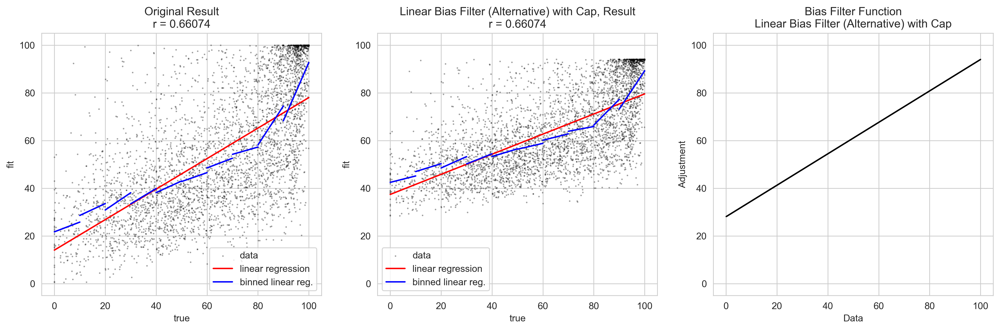

           |    Original     | Linear Bias Filter (Alternative) with Cap | Original (Inverse) | Linear Bias Filter (Alternative) with Cap (Inverse)
-----------+-----------------+-------------------------------------------+--------------------+----------------------------------------------------
     Slope |   0.63952250    |                0.42156121                 |     0.68265411     |                     1.03560919                     
 Intercept |   14.03950992   |                37.39378153                |    26.54413907     |                     -2.59707560                    
Corr Coeff |   0.66073646    |                0.66073646                 |     0.66073646     |                     0.66073646                     
  Variance |   0.43657266    |                0.43657266                 |     0.43657266     |                     0.43657266                     



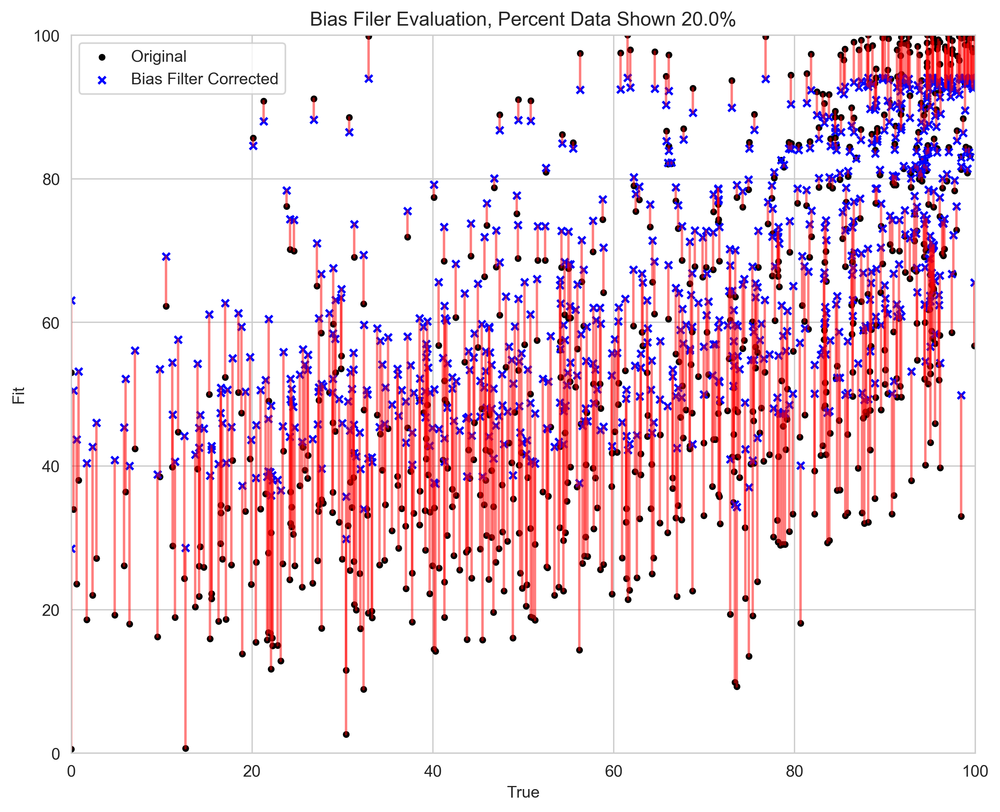

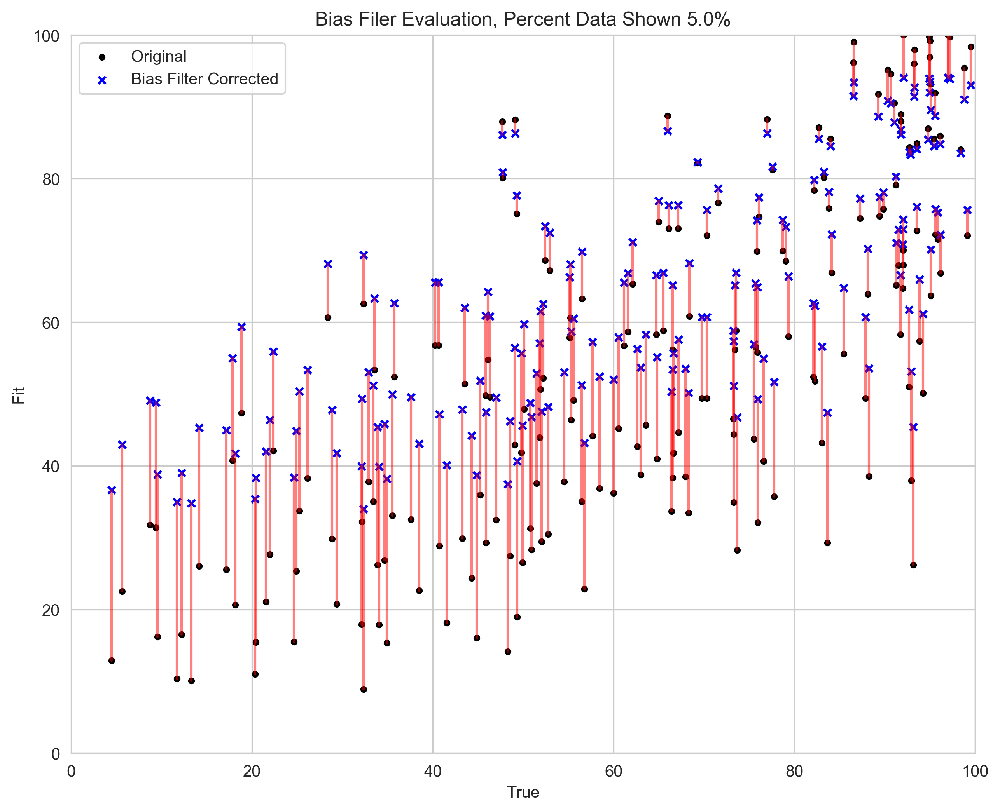

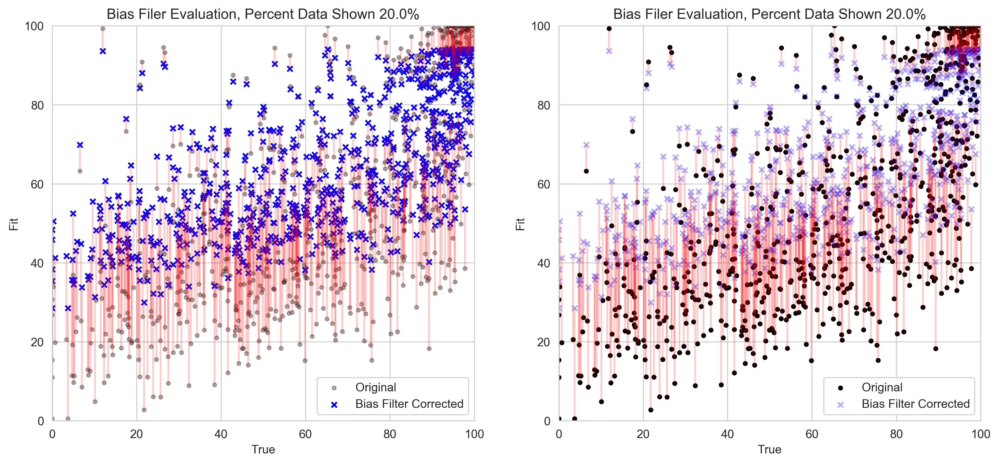

---- BEFORE ----
  RMSE: 23.575766426892354
   MAE: 18.248482051282053
r-value: 0.6607364562122842

---- AFTER  ----
  RMSE: 20.1497617580957
   MAE: 15.736869832276271
r-value: 0.6607364562122843


(20.1497617580957, 15.736869832276271, 0.6607364562122843)

In [29]:
lbf = Linear_Bias_Filter_Alternative().default_with_cap().set_cap(0, 100).train(training_data["y_hat_ERA5"], training_data["ERA5"])

lbf.report(testing_data["y_hat_ERA5"], testing_data["ERA5"])

bias_filter_evaluation(testing_data["y_hat_ERA5"], testing_data["ERA5"], lbf)
bias_filter_evaluation(testing_data["y_hat_ERA5"], testing_data["ERA5"], lbf, percent_shown=0.05)
bias_filter_evaluation_double_graph(testing_data["y_hat_ERA5"], testing_data["ERA5"], lbf)

print("---- BEFORE ----")
print_stats(testing_data["y_hat_ERA5"], testing_data["ERA5"])
print()
print("---- AFTER  ----")
print_stats(testing_data["y_hat_ERA5"], lbf(testing_data["ERA5"]))

#### Polynomial Bias Filter

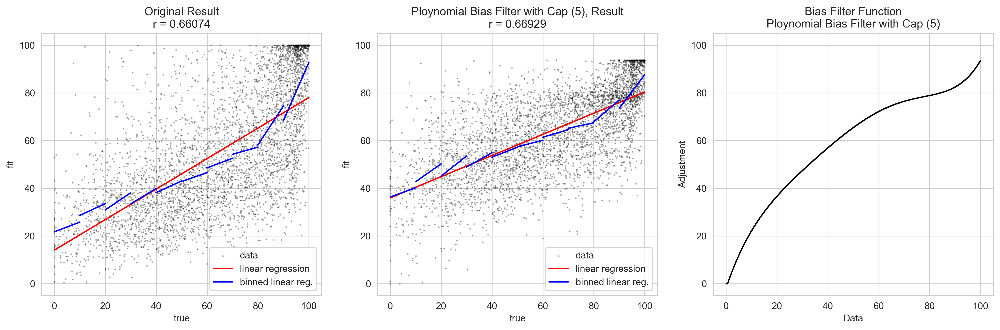

           |    Original     | Ploynomial Bias Filter with Cap (5) | Original (Inverse) | Ploynomial Bias Filter with Cap (5) (Inverse)
-----------+-----------------+-------------------------------------+--------------------+----------------------------------------------
     Slope |   0.63952250    |             0.44378916              |     0.68265411     |                  1.00936707                  
 Intercept |   14.03950992   |             35.95379464             |    26.54413907     |                  -0.89160312                 
Corr Coeff |   0.66073646    |             0.66928780              |     0.66073646     |                  0.66928780                  
  Variance |   0.43657266    |             0.44794616              |     0.43657266     |                  0.44794616                  



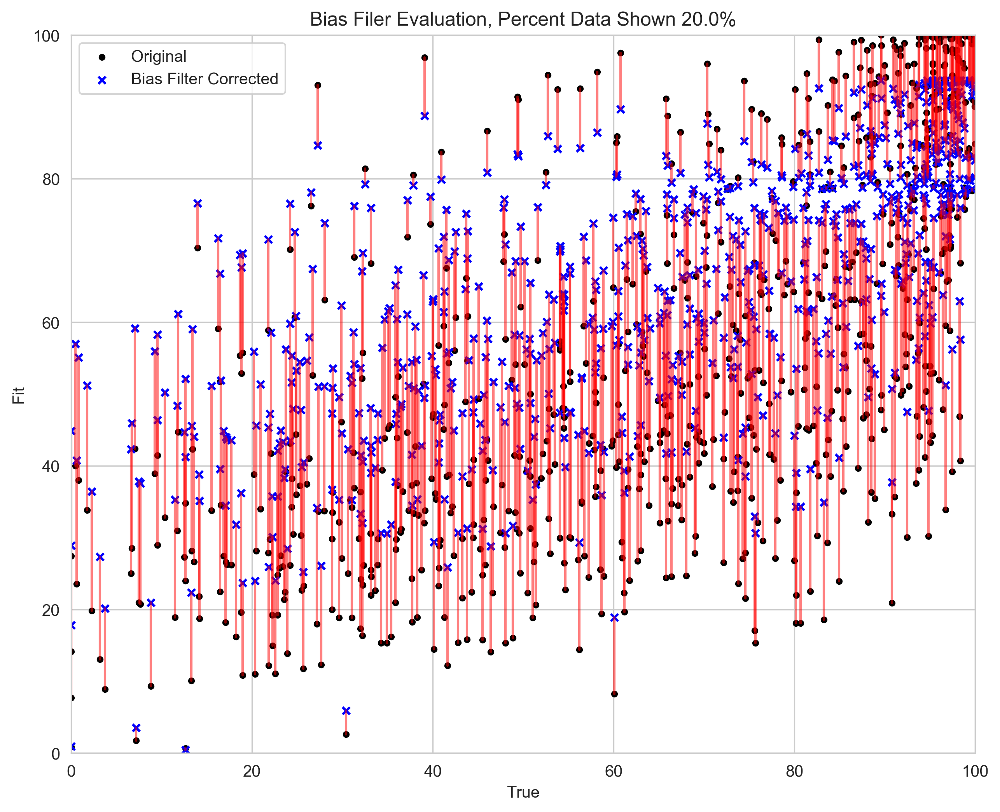

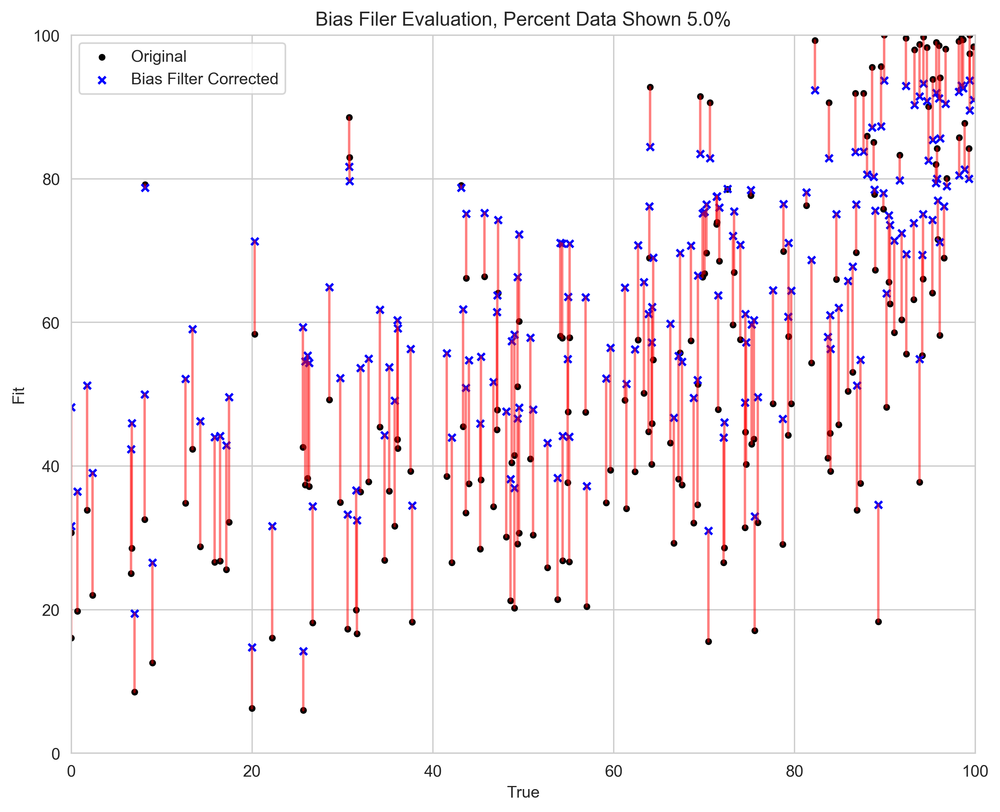

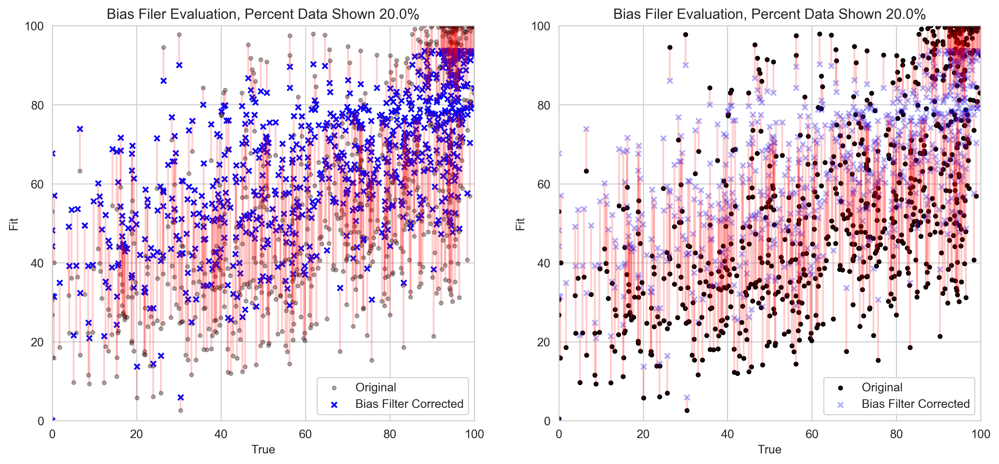

---- BEFORE ----
  RMSE: 23.575766426892354
   MAE: 18.248482051282053
r-value: 0.6607364562122842

---- AFTER  ----
  RMSE: 19.936748039164993
   MAE: 15.602556178817135
r-value: 0.6692878025591763


(19.936748039164993, 15.602556178817135, 0.6692878025591763)

In [30]:
bfs = Polynomial_Bias_Filter().default_with_cap().set_degree(5).set_cap(0, 100).train(training_data["y_hat_ERA5"], training_data["ERA5"])

bfs.report(testing_data["y_hat_ERA5"], testing_data["ERA5"])

bias_filter_evaluation(testing_data["y_hat_ERA5"], testing_data["ERA5"], bfs)
bias_filter_evaluation(testing_data["y_hat_ERA5"], testing_data["ERA5"], bfs, percent_shown=0.05)
bias_filter_evaluation_double_graph(testing_data["y_hat_ERA5"], testing_data["ERA5"], bfs)

print("---- BEFORE ----")
print_stats(testing_data["y_hat_ERA5"], testing_data["ERA5"])
print()
print("---- AFTER  ----")
print_stats(testing_data["y_hat_ERA5"], bfs(testing_data["ERA5"]))

[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 413.66756266772626


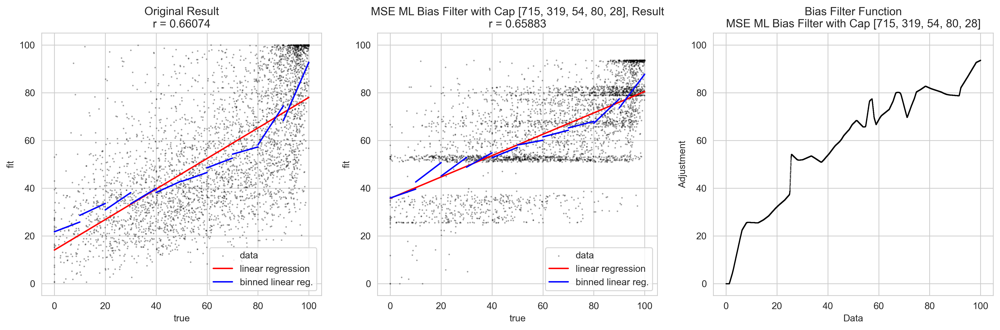

           |    Original     | MSE ML Bias Filter with Cap [715, 319, 54, 80, 28] | Original (Inverse) | MSE ML Bias Filter with Cap [715, 319, 54, 80, 28] (Inverse)
-----------+-----------------+----------------------------------------------------+--------------------+-------------------------------------------------------------
     Slope |   0.63952250    |                     0.44738860                     |     0.68265411     |                          0.97018800                         
 Intercept |   14.03950992   |                    35.72213455                     |    26.54413907     |                          1.63277316                         
Corr Coeff |   0.66073646    |                     0.65882551                     |     0.66073646     |                          0.65882551                         
  Variance |   0.43657266    |                     0.43405106                     |     0.43657266     |                          0.43405106                         



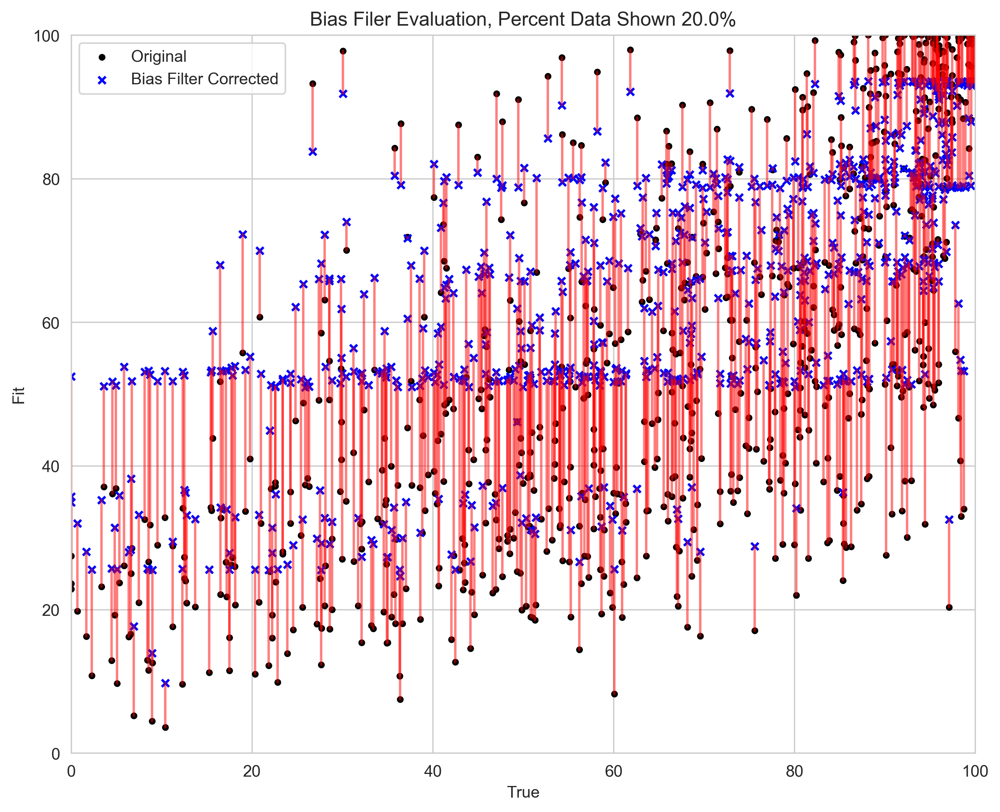

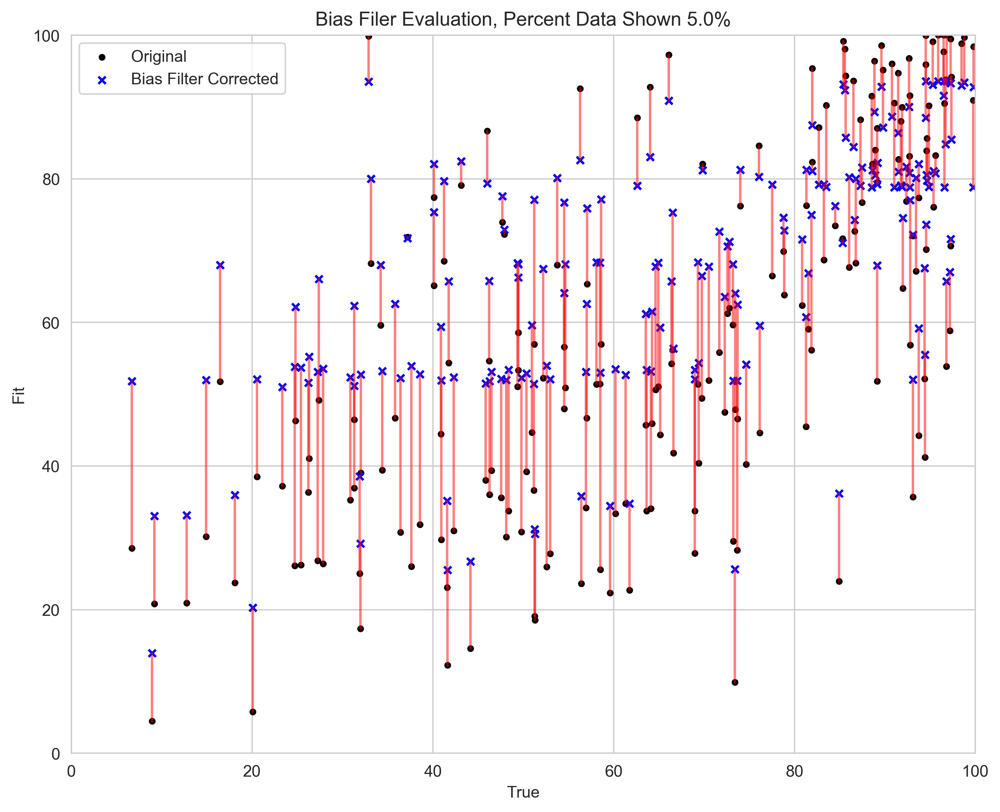

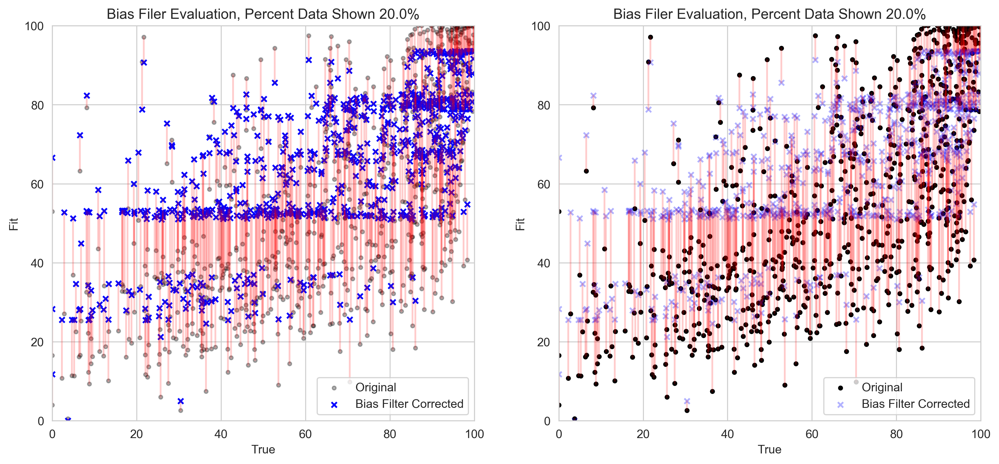

---- BEFORE ----
  RMSE: 23.575766426892354
   MAE: 18.248482051282053
r-value: 0.6607364562122842

---- AFTER  ----
  RMSE: 20.192627940295907
   MAE: 15.809713583931604
r-value: 0.658825512858554


(20.192627940295907, 15.809713583931604, 0.658825512858554)

In [31]:
mlbfs = ML_Bias_Filter_MSE().default_with_cap().set_cap(0, 100).train(training_data["y_hat_ERA5"], training_data["ERA5"])

mlbfs.report(testing_data["y_hat_ERA5"], testing_data["ERA5"])

bias_filter_evaluation(testing_data["y_hat_ERA5"], testing_data["ERA5"], mlbfs)
bias_filter_evaluation(testing_data["y_hat_ERA5"], testing_data["ERA5"], mlbfs, percent_shown=0.05)
bias_filter_evaluation_double_graph(testing_data["y_hat_ERA5"], testing_data["ERA5"], mlbfs)

print("---- BEFORE ----")
print_stats(testing_data["y_hat_ERA5"], testing_data["ERA5"])
print()
print("---- AFTER  ----")
print_stats(testing_data["y_hat_ERA5"], mlbfs(testing_data["ERA5"]))

## Functions, Data

In [32]:
RAMDOMTIME_DATA_FOLDER_PATH = "Output/combined_benchmark_anomaly_random_timestamp/"
REGULAR_DATA_FOLDER_PATH = "Output/combined_benchmark_anomaly/"
NO_ANOMALY_DATA_FOLDER_PATH = "Output/combined_benchmark/"
NO_ANOMALY_RAMDOMTIME_DATA_FOLDER_PATH = "Output/combined_benchmark_random_timestamp/"
DATA_FILE_PREFIX = "y_hat_"

In [33]:
def save_result(file_name, data):
    """
    data as {
        "y_hat":     nparray,
        "y_hat_ERA5":nparray,
        "GRU":       nparray,
        "GRU_FB":    nparray,
        "FC":        nparray,
        "FC_FB":     nparray,
        "Linear":    nparray,
        "Linear_FB": nparray,
        "ERA5":      nparray,
    }
    """
    with open(file_name, 'wb') as f:
        np.save(f, data["y_hat"])
        np.save(f, data["y_hat_ERA5"])
        np.save(f, data["GRU"])
        np.save(f, data["GRU_FB"])
        np.save(f, data["FC"])
        np.save(f, data["FC_FB"])
        np.save(f, data["Linear"])
        np.save(f, data["Linear_FB"])
        np.save(f, data["ERA5"])
        
    return file_name
        
def load_result(file_name):
    """
    return data as {
        "y_hat":     nparray,
        "y_hat_ERA5":nparray,
        "GRU":       nparray,
        "GRU_FB":    nparray,
        "FC":        nparray,
        "FC_FB":     nparray,
        "Linear":    nparray,
        "Linear_FB": nparray,
        "ERA5":      nparray,
    }
    """
    data = {}
    with open(file_name, 'rb') as f:
        data["y_hat"] = np.load(f)
        data["y_hat_ERA5"] = np.load(f)
        data["GRU"] = np.load(f)
        data["GRU_FB"] = np.load(f)
        data["FC"] = np.load(f)
        data["FC_FB"] = np.load(f)
        data["Linear"] = np.load(f)
        data["Linear_FB"] = np.load(f)
        data["ERA5"] = np.load(f)
    return data

In [34]:
def load_dicts(prefix, path):
    dicts_fill = []
    for file_name in utl.filter_file_names(prefix, path):  
        dicts_fill.append(load_result(path + file_name))
    return dicts_fill

In [35]:
def mean_bias_error(y_true, y_pred):
    return np.mean(y_true - y_pred)

def r_value(y_true, y_pred):
    return sp_stats.linregress(y_true, y_pred).rvalue

In [36]:
def compute_r_values(dicts_y):
    global pbf_collection
    global mlbf_collection
    global lbf_collection

    ret_val = {}
    ret_val["GRU"] = np.array([sp_stats.linregress(dict_y["y_hat"], dict_y["GRU"]).rvalue for dict_y in dicts_y])
    ret_val["GRU_FB"] = np.array([sp_stats.linregress(dict_y["y_hat"], dict_y["GRU_FB"]).rvalue for dict_y in dicts_y])
    ret_val["FC"] = np.array([sp_stats.linregress(dict_y["y_hat"], dict_y["FC"]).rvalue for dict_y in dicts_y])
    ret_val["FC_FB"] = np.array([sp_stats.linregress(dict_y["y_hat"], dict_y["FC_FB"]).rvalue for dict_y in dicts_y])
    ret_val["Linear"] = np.array([sp_stats.linregress(dict_y["y_hat"], dict_y["Linear"]).rvalue for dict_y in dicts_y])
    ret_val["Linear_FB"] = np.array([sp_stats.linregress(dict_y["y_hat"], dict_y["Linear_FB"]).rvalue for dict_y in dicts_y])
    ret_val["ERA5"] = np.array([sp_stats.linregress(dict_y["y_hat_ERA5"], dict_y["ERA5"]).rvalue for dict_y in dicts_y])
    
    ret_val["ERA5"] = []
    ret_val["ERA5_Linear_BF"] = []
    ret_val["ERA5_Poly_BF"] = []
    ret_val["ERA5_ML_BF"] = []
    
    for dict_y in dicts_y:
        train_idx, test_idx = utl.split_list(np.arange(len(dict_y["y_hat"])), [2, 8])
        train = {key: dict_y[key][train_idx] for key in training_data.keys()}
        test = {key: dict_y[key][test_idx] for key in training_data.keys()}
        
        ret_val["ERA5"].append(r_value(test["y_hat_ERA5"], test["ERA5"]))
        
        lbf = Linear_Bias_Filter_Alternative().default_with_cap().set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        lbf_collection.append(lbf)
        ret_val["ERA5_Linear_BF"].append(r_value(test["y_hat_ERA5"], lbf(test["ERA5"])))
        
        bfs = Polynomial_Bias_Filter().default_with_cap().set_degree(5).set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        pbf_collection.append(bfs)
        ret_val["ERA5_Poly_BF"].append(r_value(test["y_hat_ERA5"], bfs(test["ERA5"])))
        
        mlbfs = ML_Bias_Filter_MSE().default_with_cap().set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        mlbf_collection.append(mlbfs)
        ret_val["ERA5_ML_BF"].append(r_value(test["y_hat_ERA5"], mlbfs(test["ERA5"])))
        
    ret_val["ERA5"] = np.array(ret_val["ERA5"])
    ret_val["ERA5_Linear_BF"] = np.array(ret_val["ERA5_Linear_BF"])
    ret_val["ERA5_Poly_BF"] = np.array(ret_val["ERA5_Poly_BF"])
    ret_val["ERA5_ML_BF"] = np.array(ret_val["ERA5_ML_BF"])
    return ret_val

def compute_RMSE(dicts_y):
    global pbf_collection
    global mlbf_collection
    global lbf_collection
    
    ret_val = {}
    ret_val["GRU"] =       np.array([mean_squared_error(dict_y["y_hat"], dict_y["GRU"], squared=False) for dict_y in dicts_y])
    ret_val["GRU_FB"] =    np.array([mean_squared_error(dict_y["y_hat"], dict_y["GRU_FB"], squared=False) for dict_y in dicts_y])
    ret_val["FC"] =        np.array([mean_squared_error(dict_y["y_hat"], dict_y["FC"], squared=False) for dict_y in dicts_y])
    ret_val["FC_FB"] =     np.array([mean_squared_error(dict_y["y_hat"], dict_y["FC_FB"], squared=False) for dict_y in dicts_y])
    ret_val["Linear"] =    np.array([mean_squared_error(dict_y["y_hat"], dict_y["Linear"], squared=False) for dict_y in dicts_y])
    ret_val["Linear_FB"] = np.array([mean_squared_error(dict_y["y_hat"], dict_y["Linear_FB"], squared=False) for dict_y in dicts_y])
    
    ret_val["ERA5"] = []
    ret_val["ERA5_Linear_BF"] = []
    ret_val["ERA5_Poly_BF"] = []
    ret_val["ERA5_ML_BF"] = []
    
    for dict_y in dicts_y:
        train_idx, test_idx = utl.split_list(np.arange(len(dict_y["y_hat"])), [2, 8])
        train = {key: dict_y[key][train_idx] for key in training_data.keys()}
        test = {key: dict_y[key][test_idx] for key in training_data.keys()}
        
        ret_val["ERA5"].append(mean_squared_error(test["y_hat_ERA5"], test["ERA5"], squared=False))
        
        lbf = Linear_Bias_Filter_Alternative().default_with_cap().set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        lbf_collection.append(lbf)
        ret_val["ERA5_Linear_BF"].append(mean_squared_error(test["y_hat_ERA5"], lbf(test["ERA5"]), squared=False))
        
        bfs = Polynomial_Bias_Filter().default_with_cap().set_degree(5).set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        pbf_collection.append(bfs)
        ret_val["ERA5_Poly_BF"].append(mean_squared_error(test["y_hat_ERA5"], bfs(test["ERA5"]), squared=False))
        
        mlbfs = ML_Bias_Filter_MSE().default_with_cap().set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        mlbf_collection.append(mlbfs)
        ret_val["ERA5_ML_BF"].append(mean_squared_error(test["y_hat_ERA5"], mlbfs(test["ERA5"]), squared=False))
        
    ret_val["ERA5"] = np.array(ret_val["ERA5"])
    ret_val["ERA5_Linear_BF"] = np.array(ret_val["ERA5_Linear_BF"])
    ret_val["ERA5_Poly_BF"] = np.array(ret_val["ERA5_Poly_BF"])
    ret_val["ERA5_ML_BF"] = np.array(ret_val["ERA5_ML_BF"])
    return ret_val

def compute_MAE(dicts_y):
    global pbf_collection
    global mlbf_collection
    global lbf_collection
    
    ret_val = {}
    ret_val["GRU"] =       np.array([mean_absolute_error(dict_y["y_hat"], dict_y["GRU"]) for dict_y in dicts_y])
    ret_val["GRU_FB"] =    np.array([mean_absolute_error(dict_y["y_hat"], dict_y["GRU_FB"]) for dict_y in dicts_y])
    ret_val["FC"] =        np.array([mean_absolute_error(dict_y["y_hat"], dict_y["FC"]) for dict_y in dicts_y])
    ret_val["FC_FB"] =     np.array([mean_absolute_error(dict_y["y_hat"], dict_y["FC_FB"]) for dict_y in dicts_y])
    ret_val["Linear"] =    np.array([mean_absolute_error(dict_y["y_hat"], dict_y["Linear"]) for dict_y in dicts_y])
    ret_val["Linear_FB"] = np.array([mean_absolute_error(dict_y["y_hat"], dict_y["Linear_FB"]) for dict_y in dicts_y])
    
    ret_val["ERA5"] = []
    ret_val["ERA5_Linear_BF"] = []
    ret_val["ERA5_Poly_BF"] = []
    ret_val["ERA5_ML_BF"] = []
    
    for dict_y in dicts_y:
        train_idx, test_idx = utl.split_list(np.arange(len(dict_y["y_hat"])), [2, 8])
        train = {key: dict_y[key][train_idx] for key in training_data.keys()}
        test = {key: dict_y[key][test_idx] for key in training_data.keys()}
        
        ret_val["ERA5"].append(mean_absolute_error(test["y_hat_ERA5"], test["ERA5"]))
        
        lbf = Linear_Bias_Filter_Alternative().default_with_cap().set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        lbf_collection.append(lbf)
        ret_val["ERA5_Linear_BF"].append(mean_absolute_error(test["y_hat_ERA5"], lbf(test["ERA5"])))
        
        bfs = Polynomial_Bias_Filter().default_with_cap().set_degree(5).set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        pbf_collection.append(bfs)
        ret_val["ERA5_Poly_BF"].append(mean_absolute_error(test["y_hat_ERA5"], bfs(test["ERA5"])))
        
        mlbfs = ML_Bias_Filter_MSE().default_with_cap().set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        mlbf_collection.append(mlbfs)
        ret_val["ERA5_ML_BF"].append(mean_absolute_error(test["y_hat_ERA5"], mlbfs(test["ERA5"])))
        
    ret_val["ERA5"] = np.array(ret_val["ERA5"])
    ret_val["ERA5_Linear_BF"] = np.array(ret_val["ERA5_Linear_BF"])
    ret_val["ERA5_Poly_BF"] = np.array(ret_val["ERA5_Poly_BF"])
    ret_val["ERA5_ML_BF"] = np.array(ret_val["ERA5_ML_BF"])
    return ret_val

def compute_MBE(dicts_y):
    global pbf_collection
    global mlbf_collection
    global lbf_collection
    
    ret_val = {}
    ret_val["GRU"] =       np.array([mean_bias_error(dict_y["y_hat"], dict_y["GRU"]) for dict_y in dicts_y])
    ret_val["GRU_FB"] =    np.array([mean_bias_error(dict_y["y_hat"], dict_y["GRU_FB"]) for dict_y in dicts_y])
    ret_val["FC"] =        np.array([mean_bias_error(dict_y["y_hat"], dict_y["FC"]) for dict_y in dicts_y])
    ret_val["FC_FB"] =     np.array([mean_bias_error(dict_y["y_hat"], dict_y["FC_FB"]) for dict_y in dicts_y])
    ret_val["Linear"] =    np.array([mean_bias_error(dict_y["y_hat"], dict_y["Linear"]) for dict_y in dicts_y])
    ret_val["Linear_FB"] = np.array([mean_bias_error(dict_y["y_hat"], dict_y["Linear_FB"]) for dict_y in dicts_y])
    
    ret_val["ERA5"] = []
    ret_val["ERA5_Linear_BF"] = []
    ret_val["ERA5_Poly_BF"] = []
    ret_val["ERA5_ML_BF"] = []
    
    for dict_y in dicts_y:
        train_idx, test_idx = utl.split_list(np.arange(len(dict_y["y_hat"])), [2, 8])
        train = {key: dict_y[key][train_idx] for key in training_data.keys()}
        test = {key: dict_y[key][test_idx] for key in training_data.keys()}
        
        ret_val["ERA5"].append(mean_bias_error(test["y_hat_ERA5"], test["ERA5"]))
        
        lbf = Linear_Bias_Filter_Alternative().default_with_cap().set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        lbf_collection.append(lbf)
        ret_val["ERA5_Linear_BF"].append(mean_bias_error(test["y_hat_ERA5"], lbf(test["ERA5"])))
        
        bfs = Polynomial_Bias_Filter().default_with_cap().set_degree(5).set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        pbf_collection.append(bfs)
        ret_val["ERA5_Poly_BF"].append(mean_bias_error(test["y_hat_ERA5"], bfs(test["ERA5"])))
        
        mlbfs = ML_Bias_Filter_MSE().default_with_cap().set_cap(0, 100).train(train["y_hat_ERA5"], train["ERA5"])
        mlbf_collection.append(mlbfs)
        ret_val["ERA5_ML_BF"].append(mean_bias_error(test["y_hat_ERA5"], mlbfs(test["ERA5"])))
        
    ret_val["ERA5"] = np.array(ret_val["ERA5"])
    ret_val["ERA5_Linear_BF"] = np.array(ret_val["ERA5_Linear_BF"])
    ret_val["ERA5_Poly_BF"] = np.array(ret_val["ERA5_Poly_BF"])
    ret_val["ERA5_ML_BF"] = np.array(ret_val["ERA5_ML_BF"])
    return ret_val


def compute_spearman_r_values(dicts_y):
    ret_val = {}
    ret_val["GRU"] = np.array([sp_stats.spearmanr(dict_y["y_hat"], dict_y["GRU"]).correlation for dict_y in dicts_y])
    ret_val["GRU_FB"] = np.array([sp_stats.spearmanr(dict_y["y_hat"], dict_y["GRU_FB"]).correlation for dict_y in dicts_y])
    ret_val["FC"] = np.array([sp_stats.spearmanr(dict_y["y_hat"], dict_y["FC"]).correlation for dict_y in dicts_y])
    ret_val["FC_FB"] = np.array([sp_stats.spearmanr(dict_y["y_hat"], dict_y["FC_FB"]).correlation for dict_y in dicts_y])
    ret_val["Linear"] = np.array([sp_stats.spearmanr(dict_y["y_hat"], dict_y["Linear"]).correlation for dict_y in dicts_y])
    ret_val["Linear_FB"] = np.array([sp_stats.spearmanr(dict_y["y_hat"], dict_y["Linear_FB"]).correlation for dict_y in dicts_y])
    ret_val["ERA5"] = np.array([sp_stats.spearmanr(dict_y["y_hat_ERA5"], dict_y["ERA5"]).correlation for dict_y in dicts_y])
    return ret_val

In [37]:
def plot_model_comparison(dicts_y, title, xlim=None):
    r_values = compute_r_values(dicts_y)
    
    plt.figure(figsize=[8, 6])
    # plt.figure(figsize=[8, 6], dpi=300)

    plt.boxplot((
        r_values["GRU"], 
        r_values["GRU_FB"], 
        r_values["FC"], 
        r_values["FC_FB"], 
        r_values["Linear"], 
        r_values["Linear_FB"],
        r_values["ERA5"], 
    ), vert=False, labels=[
        "GRU",
        "GRU_FB",    
        "FC",
        "FC_FB",
        "Linear",
        "Linear_FB",
        "ERA5",
    ])

    plt.vlines(np.mean(r_values["ERA5"]), 0.5, 9.5, colors="r", linestyles="dashed", alpha=0.5, label="ERA5 Mean r-Value")

    plt.ylim([0.5, 7.5])
    if (xlim is not None):
        plt.xlim(xlim)
    plt.xlabel("r-Value")

    plt.legend()

    plt.title("{0}\nSample Size:{1}".format(title, len(r_values["GRU"])))
    plt.show()
    
def plot_model_comparison_spearman_r(dicts_y, title, xlim=None):
    r_values = compute_spearman_r_values(dicts_y)
    
    plt.figure(figsize=[8, 6])
    # plt.figure(figsize=[8, 6], dpi=300)

    plt.boxplot((
        r_values["GRU"], 
        r_values["GRU_FB"], 
        r_values["FC"], 
        r_values["FC_FB"], 
        r_values["Linear"], 
        r_values["Linear_FB"],
        r_values["ERA5"], 
    ), vert=False, labels=[
        "GRU",
        "GRU_FB",    
        "FC",
        "FC_FB",
        "Linear",
        "Linear_FB",
        "ERA5",
    ])

    plt.vlines(np.mean(r_values["ERA5"]), 0.5, 9.5, colors="r", linestyles="dashed", alpha=0.5, label="ERA5 Mean r-Value")

    plt.ylim([0.5, 7.5])
    if (xlim is not None):
        plt.xlim(xlim)
    plt.xlabel("r-Value")

    plt.legend()

    plt.title("{0}\nSample Size:{1}".format(title, len(r_values["GRU"])))
    plt.show()

## Bias Filter Collection

In [38]:
pbf_collection = []
mlbf_collection = []
lbf_collection = []

## Pearson Correlation

In [39]:
data_ns = pd.DataFrame(compute_r_values(load_dicts(DATA_FILE_PREFIX, NO_ANOMALY_DATA_FOLDER_PATH)))
data_as = pd.DataFrame(compute_r_values(load_dicts(DATA_FILE_PREFIX, REGULAR_DATA_FOLDER_PATH)))
data_nr = pd.DataFrame(compute_r_values(load_dicts(DATA_FILE_PREFIX, NO_ANOMALY_RAMDOMTIME_DATA_FOLDER_PATH)))
data_ar = pd.DataFrame(compute_r_values(load_dicts(DATA_FILE_PREFIX, RAMDOMTIME_DATA_FOLDER_PATH)))

[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 363.2591629211018
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 412.2176764213217
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 416.8374186961682
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 396.8716209906811
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 355.0847240354291
[1000/1000|100.0%] [========================================] [6s / 6s] Training; Attemp 1; Current Loss: 437.879883695643
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 391.8543182561177
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 384.9676893393815
[1000/100

In [40]:
x = data_ns.melt(var_name="model", value_name=("r-value"))

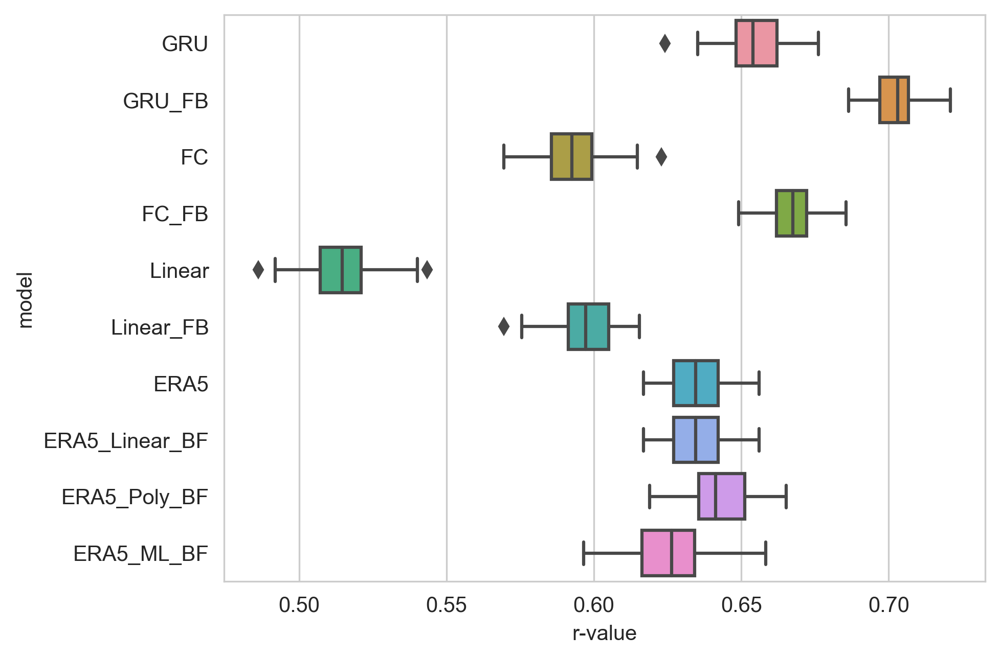

In [41]:
sns.boxplot(data=x, x="r-value", y="model")
plt.show()

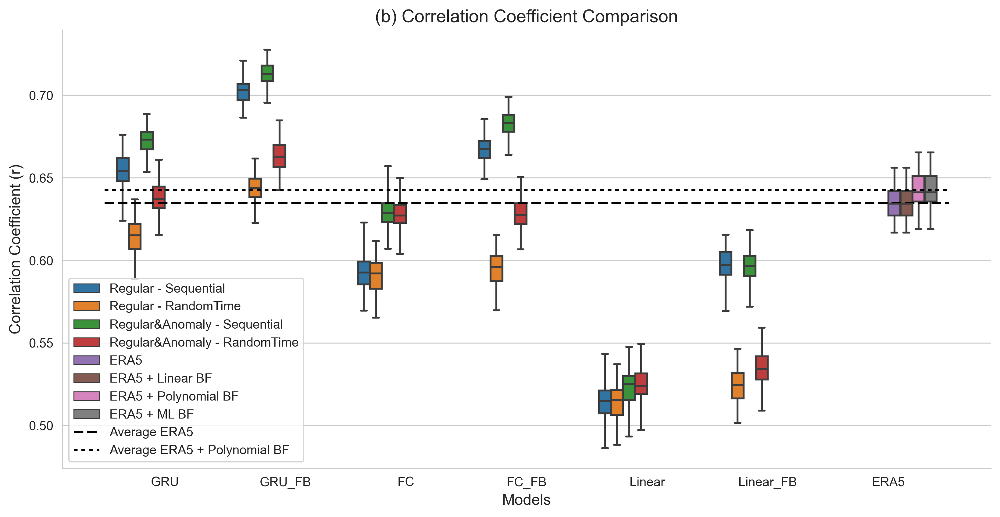

In [42]:
df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF", "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
df["config"] = "Regular - Sequential"

df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_RandomTime["config"] = "Regular - RandomTime"

df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_Anomaly["config"] = "Regular&Anomaly - Sequential"

df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 + Linear BF"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 + Polynomial BF"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 + ML BF"

df_all = pd.concat([df, df_RandomTime, df_Anomaly, df_RandomTime_Anomaly, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(data=df_all, x="model_name", y="r-value", hue="config", kind="box", whis=np.infty, height=5.5, aspect=2, legend=False)
plt.hlines(np.mean(df_ERA5["r-value"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="Average ERA5")
plt.hlines(np.mean(df_ERA5_Poly_BF["r-value"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="Average ERA5 + Polynomial BF")
plt.legend()
plt.title("(b) Correlation Coefficient Comparison", fontsize=14)
plt.xlabel("Models", fontsize=12)
plt.ylabel("Correlation Coefficient (r)", fontsize=12)
plt.show()

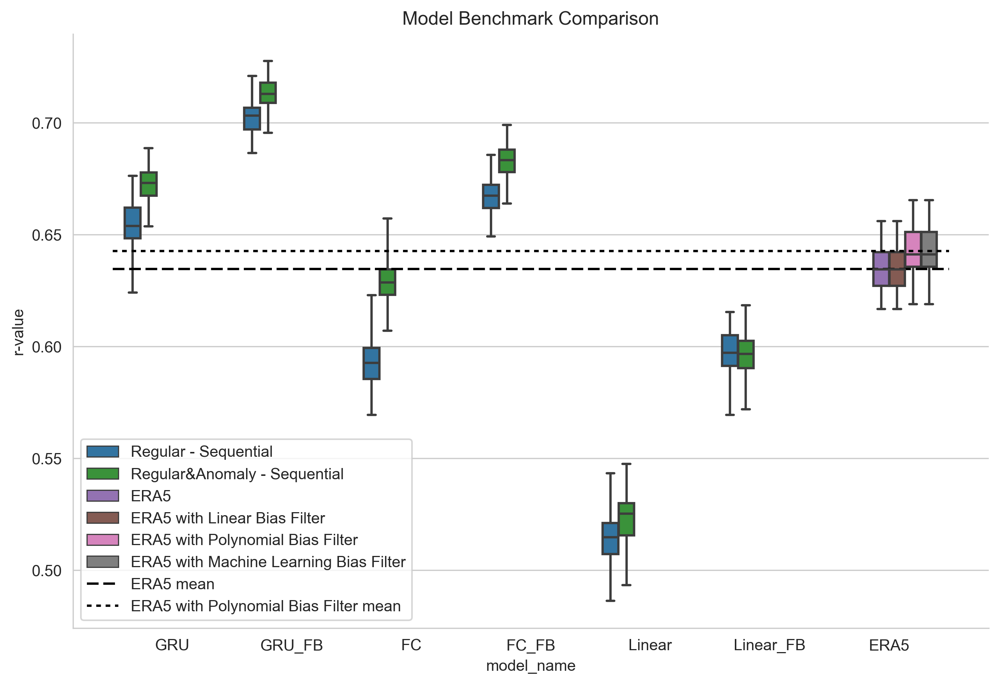

In [43]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}

df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
df["config"] = "Regular - Sequential"

# df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
# df_RandomTime["config"] = "Regular - RandomTime"

df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_Anomaly, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="r-value", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=6, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["r-value"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["r-value"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

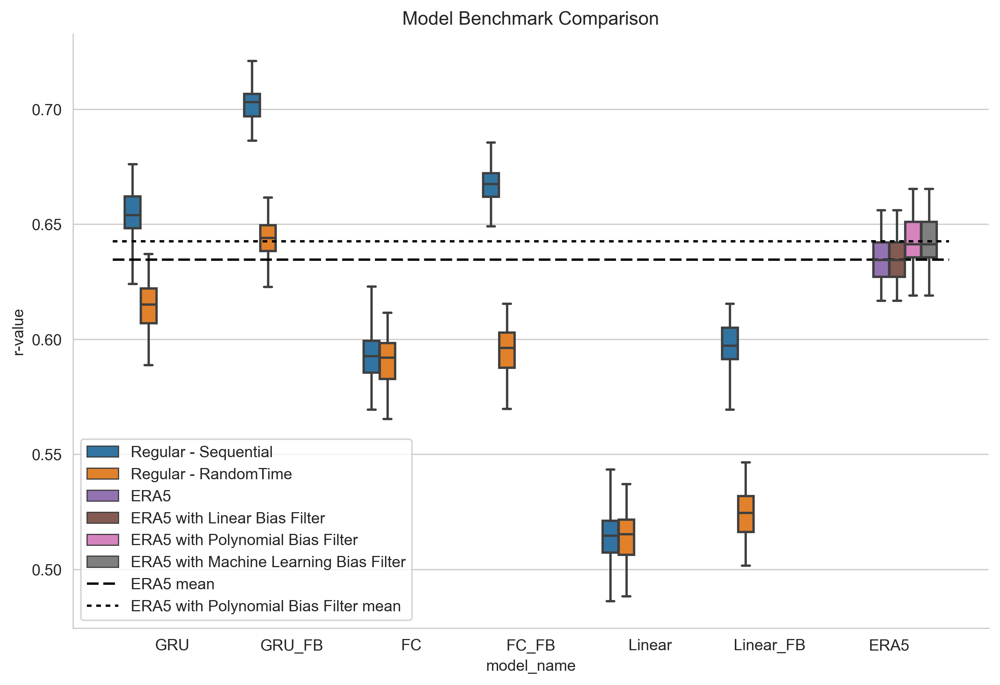

In [44]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}

df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
df["config"] = "Regular - Sequential"

df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_RandomTime["config"] = "Regular - RandomTime"

# df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
# df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_RandomTime, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="r-value", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=6, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["r-value"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["r-value"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

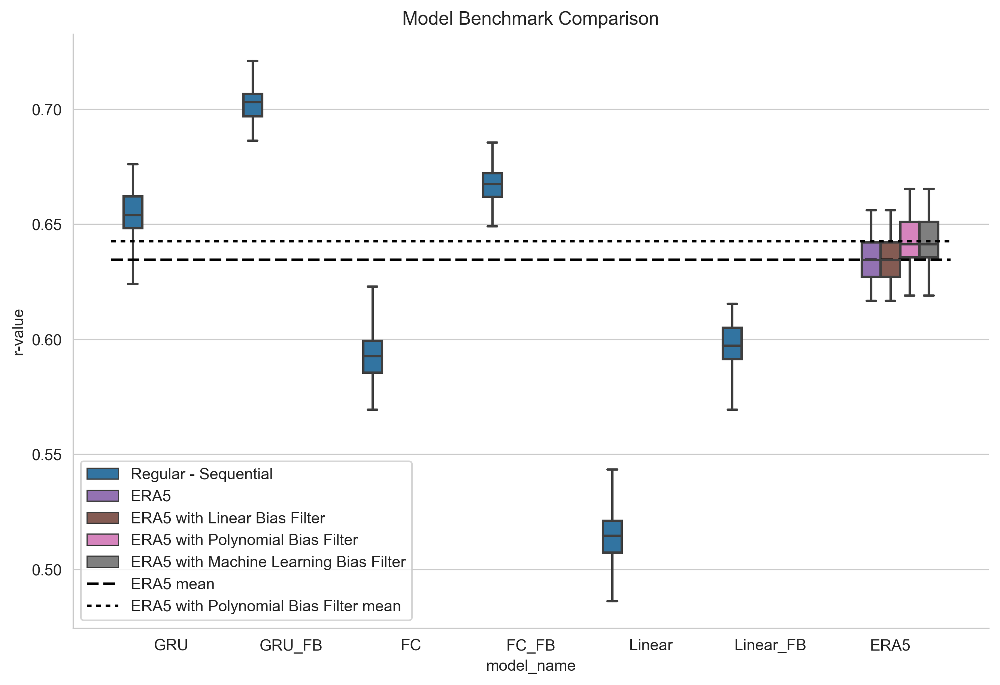

In [45]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}


df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
df["config"] = "Regular - Sequential"

# df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
# df_RandomTime["config"] = "Regular - RandomTime"

# df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
# df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="r-value", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="r-value", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="r-value", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=6, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["r-value"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["r-value"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

## Root Mean Square Error

In [46]:
data_ns = pd.DataFrame(compute_RMSE(load_dicts(DATA_FILE_PREFIX, NO_ANOMALY_DATA_FOLDER_PATH)))
data_as = pd.DataFrame(compute_RMSE(load_dicts(DATA_FILE_PREFIX, REGULAR_DATA_FOLDER_PATH)))
data_nr = pd.DataFrame(compute_RMSE(load_dicts(DATA_FILE_PREFIX, NO_ANOMALY_RAMDOMTIME_DATA_FOLDER_PATH)))
data_ar = pd.DataFrame(compute_RMSE(load_dicts(DATA_FILE_PREFIX, RAMDOMTIME_DATA_FOLDER_PATH)))

[1000/1000|100.0%] [========================================] [3s / 3s] Training; Attemp 1; Current Loss: 402.7196851428276
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 375.31541586267906
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 388.3149685998021
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 395.76435686033676
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 340.77287576612986
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 431.29704956794365
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 381.6767589797832
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 404.31967362427855


[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 355.0625531589066
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 387.9488128844401
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 383.4655481092188
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 389.9750749607492
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 394.94600434831574
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 396.2154019466695
[1000/1000|100.0%] [========================================] [6s / 6s] Training; Attemp 1; Current Loss: 372.93277097760034
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 362.69776451636534
[1000

In [47]:
x = data_ns.melt(var_name="model", value_name=("RMSE"))

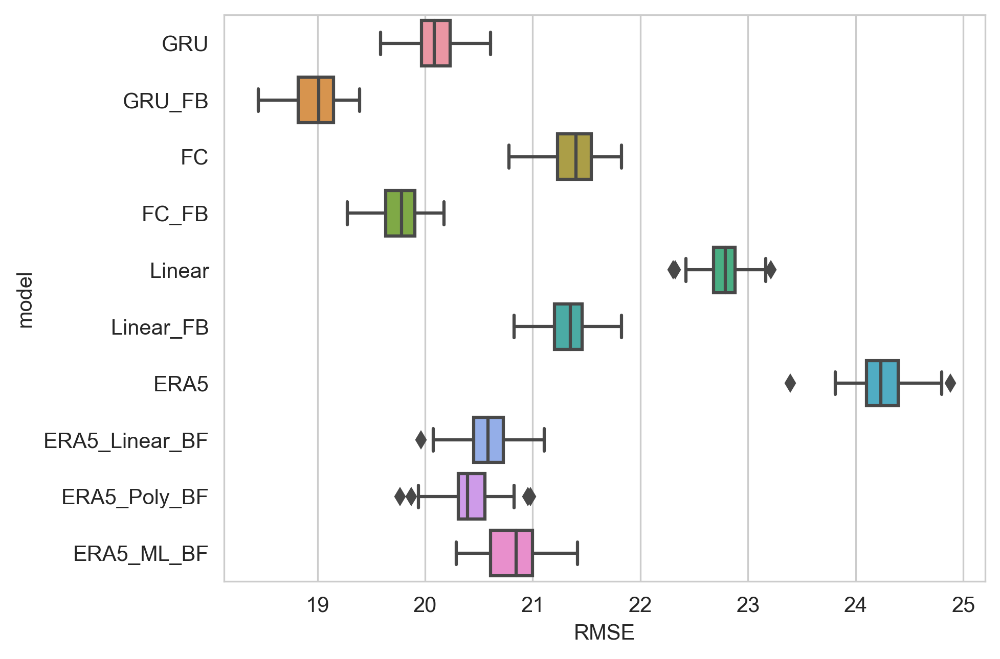

In [48]:
sns.boxplot(data=x, x="RMSE", y="model")
plt.show()

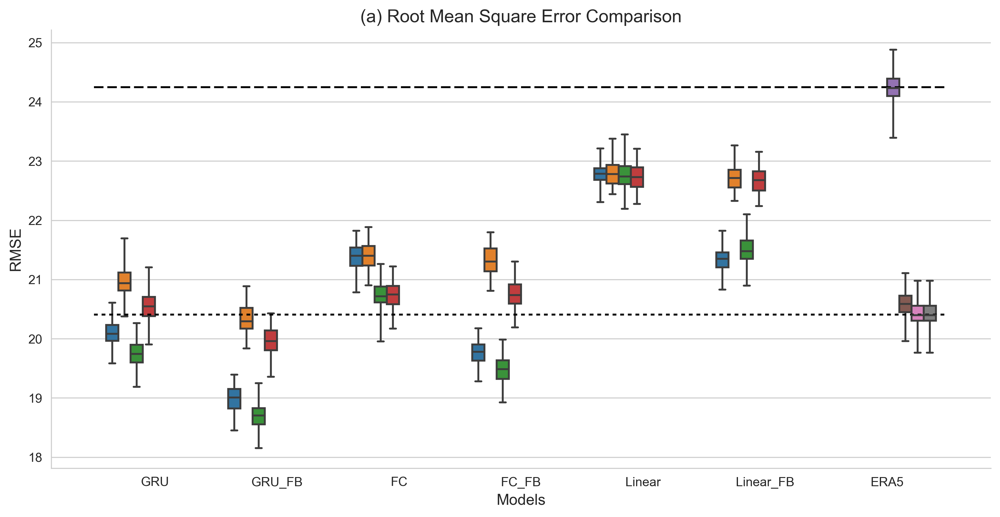

In [49]:
df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df["config"] = "Regular - Sequential"

df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_RandomTime["config"] = "Regular - RandomTime"

df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_Anomaly["config"] = "Regular&Anomaly - Sequential"

df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 + Linear BF"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 + Polynomial BF"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 + ML BF"

df_all = pd.concat([df, df_RandomTime, df_Anomaly, df_RandomTime_Anomaly, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(data=df_all, x="model_name", y="RMSE", hue="config", kind="box", whis=np.infty, height=5.5, aspect=2, legend=False)
plt.hlines(np.mean(df_ERA5["RMSE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["RMSE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 + Polynomial BF mean")
plt.title("(a) Root Mean Square Error Comparison", fontsize=14)
plt.xlabel("Models", fontsize=12)
plt.ylabel("RMSE", fontsize=12)
plt.show()

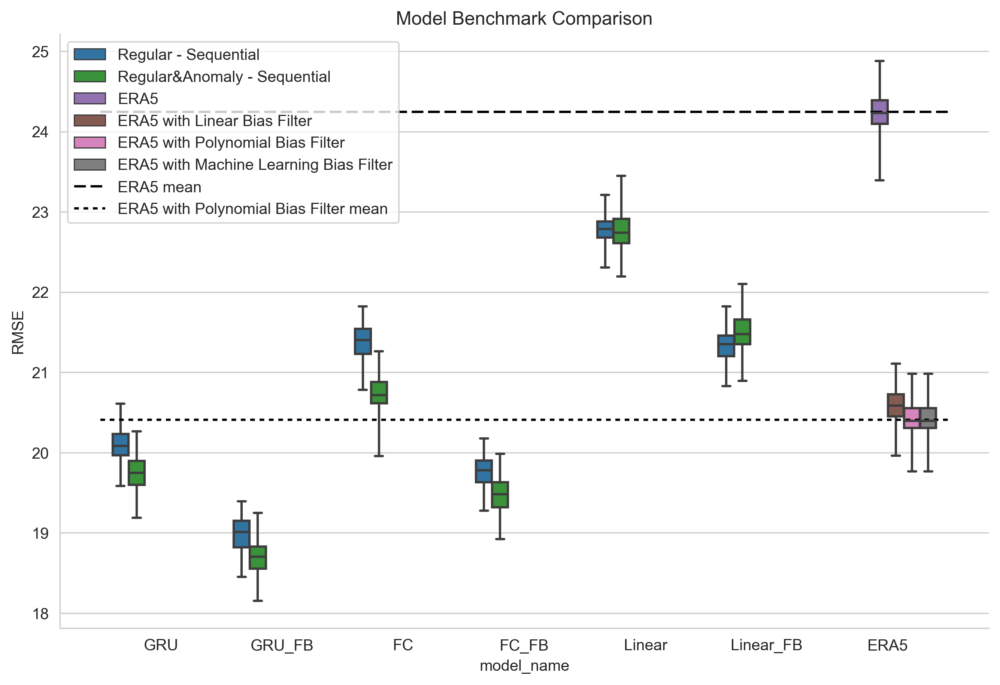

In [50]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}

df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df["config"] = "Regular - Sequential"

# df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
# df_RandomTime["config"] = "Regular - RandomTime"

df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_Anomaly, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="RMSE", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=6, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["RMSE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["RMSE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

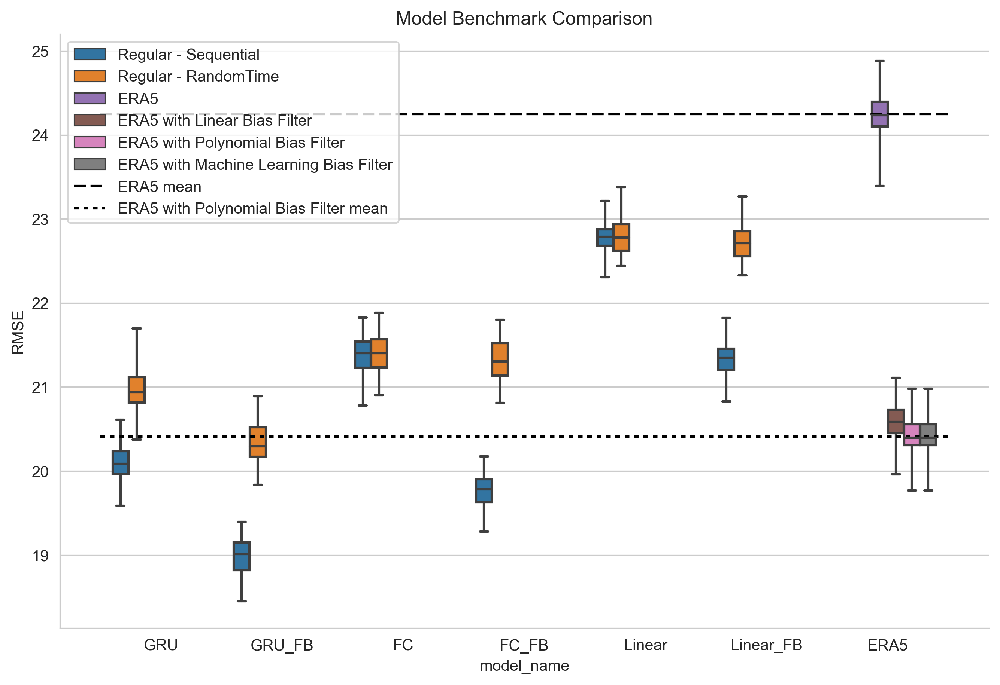

In [51]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}


df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df["config"] = "Regular - Sequential"

df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_RandomTime["config"] = "Regular - RandomTime"

# df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
# df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_RandomTime, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="RMSE", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=6, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["RMSE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["RMSE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

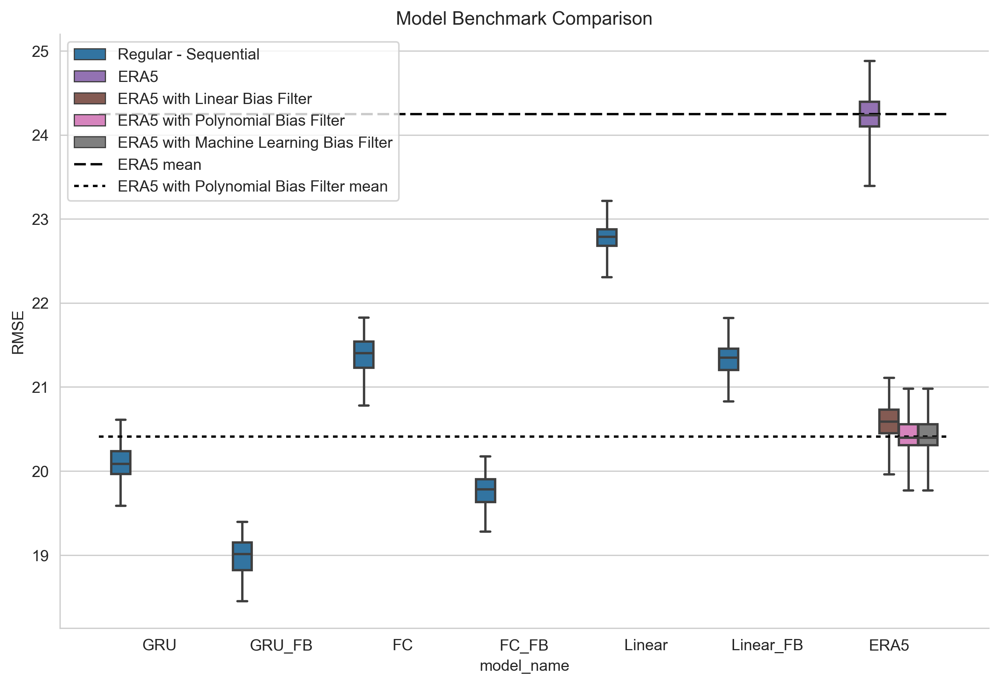

In [52]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}


df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df["config"] = "Regular - Sequential"

# df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
# df_RandomTime["config"] = "Regular - RandomTime"

# df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
# df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="RMSE", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="RMSE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="RMSE", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=6, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["RMSE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["RMSE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

## Mean Absolute Error

In [53]:
data_ns = pd.DataFrame(compute_MAE(load_dicts(DATA_FILE_PREFIX, NO_ANOMALY_DATA_FOLDER_PATH)))
data_as = pd.DataFrame(compute_MAE(load_dicts(DATA_FILE_PREFIX, REGULAR_DATA_FOLDER_PATH)))
data_nr = pd.DataFrame(compute_MAE(load_dicts(DATA_FILE_PREFIX, NO_ANOMALY_RAMDOMTIME_DATA_FOLDER_PATH)))
data_ar = pd.DataFrame(compute_MAE(load_dicts(DATA_FILE_PREFIX, RAMDOMTIME_DATA_FOLDER_PATH)))

[1000/1000|100.0%] [========================================] [3s / 3s] Training; Attemp 1; Current Loss: 425.6132052201213
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 383.335144598234
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 401.9447274667202
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 392.35433567095447
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 377.06035162882813
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 440.7407474586698
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 380.20377201386975
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 379.0231445192734
[1000/

[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 402.1486316861372
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 385.3466619552121
[1000/1000|100.0%] [========================================] [6s / 6s] Training; Attemp 1; Current Loss: 411.65217671446874
[1000/1000|100.0%] [========================================] [6s / 6s] Training; Attemp 1; Current Loss: 397.4904005563576
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 369.1484273511547
[1000/1000|100.0%] [========================================] [6s / 6s] Training; Attemp 1; Current Loss: 396.82084798368356
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 378.32787963310955
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 385.75477798228076
[100

In [54]:
x = data_ns.melt(var_name="model", value_name=("MAE"))

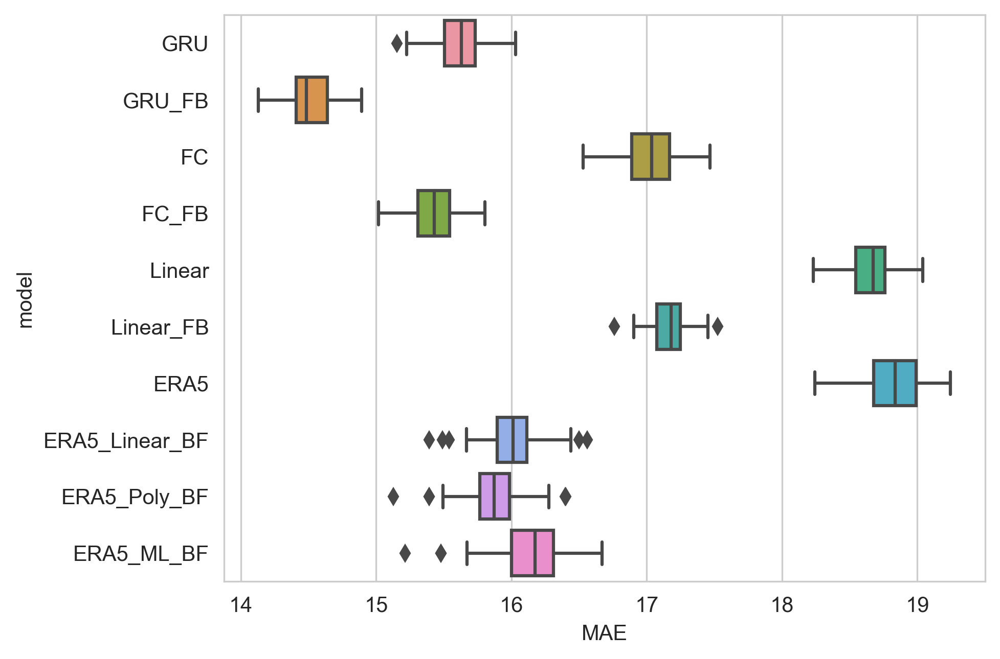

In [55]:
sns.boxplot(data=x, x="MAE", y="model")
plt.show()

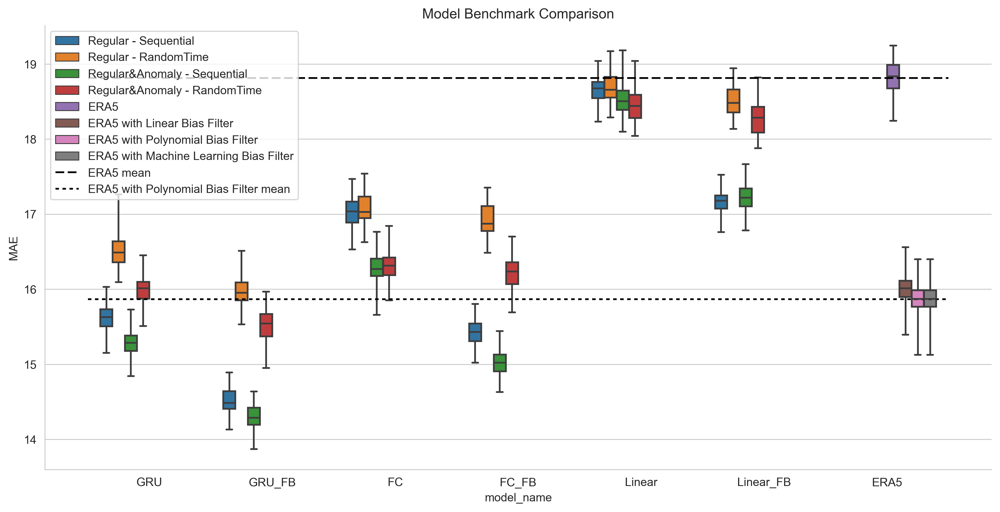

In [56]:
df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
df["config"] = "Regular - Sequential"

df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_RandomTime["config"] = "Regular - RandomTime"

df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_Anomaly["config"] = "Regular&Anomaly - Sequential"

df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_RandomTime, df_Anomaly, df_RandomTime_Anomaly, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(data=df_all, x="model_name", y="MAE", hue="config", kind="box", whis=np.infty, height=6, aspect=2, legend=False)
plt.hlines(np.mean(df_ERA5["MAE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["MAE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")
plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

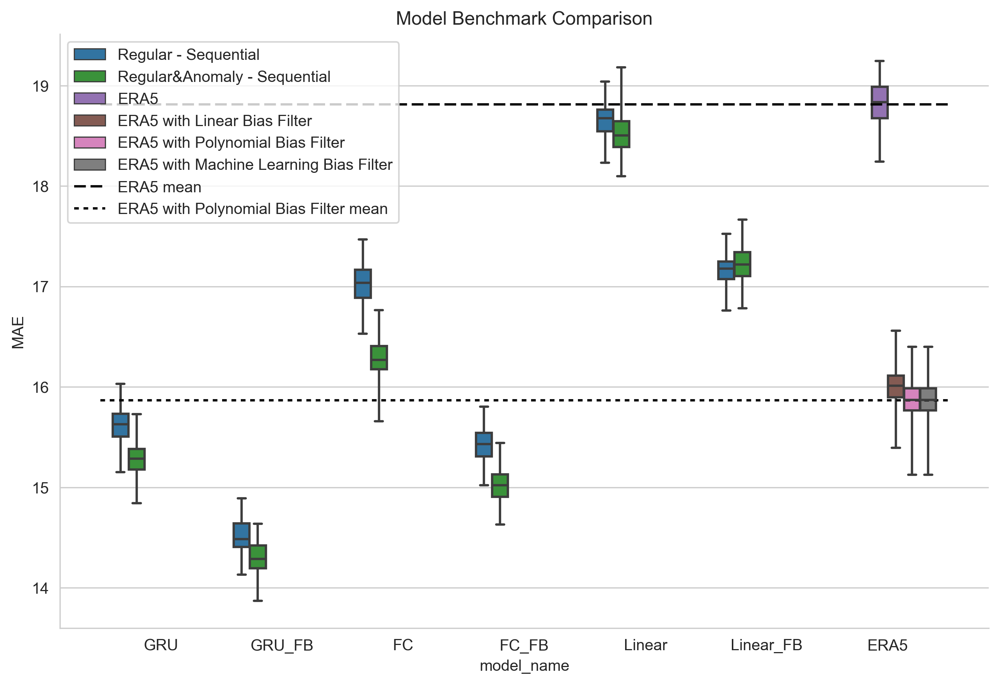

In [57]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}

df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
df["config"] = "Regular - Sequential"

# df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
# df_RandomTime["config"] = "Regular - RandomTime"

df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_Anomaly, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="MAE", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=6, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["MAE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["MAE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

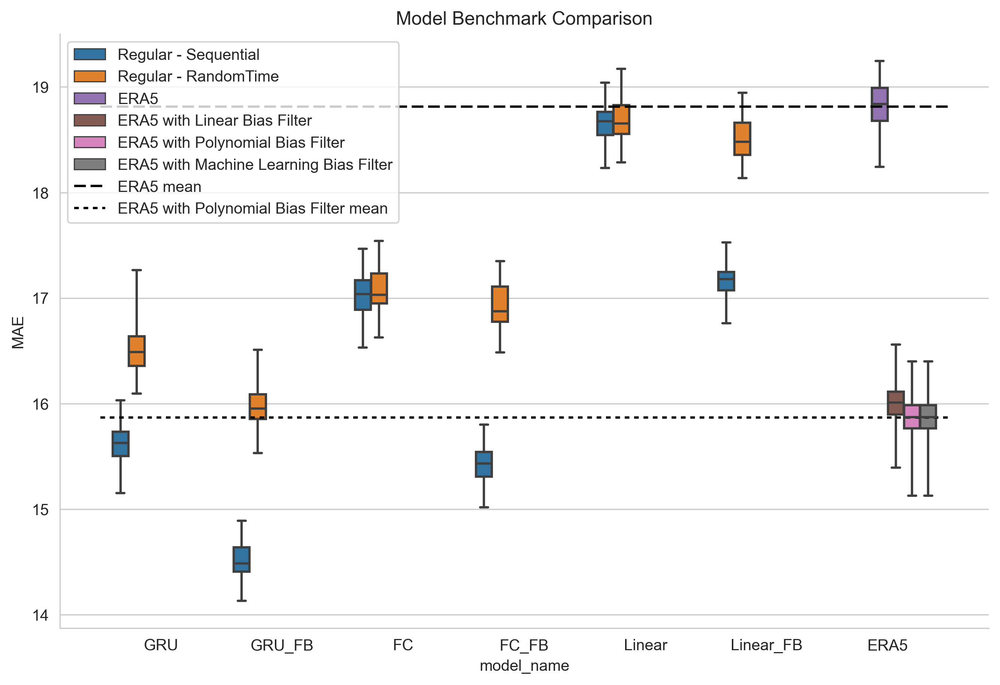

In [58]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}


df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
df["config"] = "Regular - Sequential"

df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_RandomTime["config"] = "Regular - RandomTime"

# df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
# df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_RandomTime, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="MAE", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=6, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["MAE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["MAE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

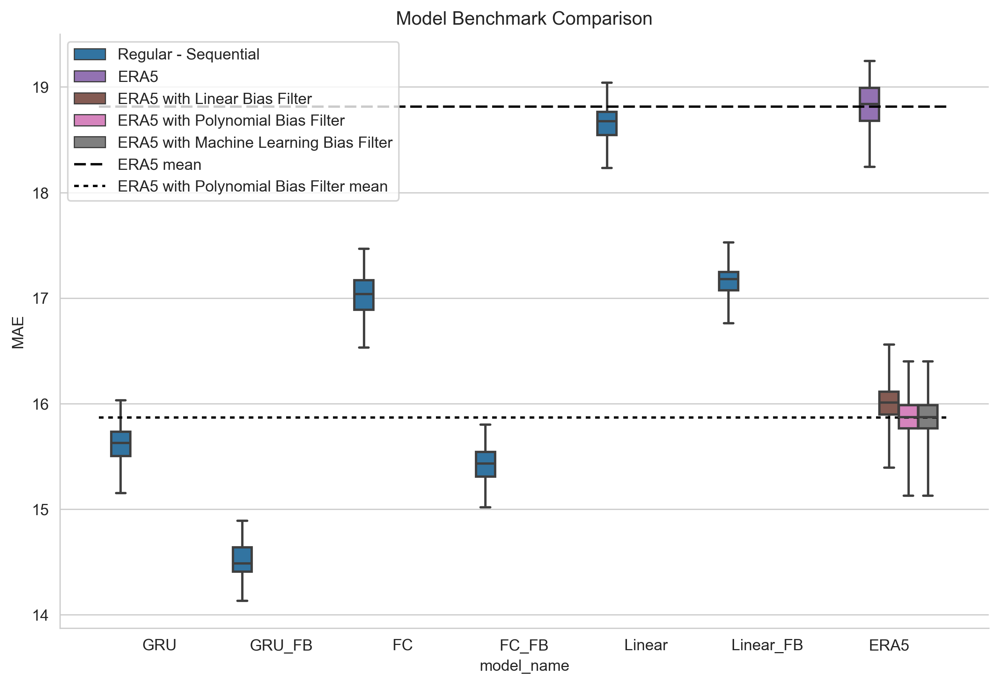

In [59]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}


df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
df["config"] = "Regular - Sequential"

# df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
# df_RandomTime["config"] = "Regular - RandomTime"

# df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
# df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MAE", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MAE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="MAE", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=6, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["MAE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["MAE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

## Mean Bias Error

In [60]:
data_ns = pd.DataFrame(compute_MBE(load_dicts(DATA_FILE_PREFIX, NO_ANOMALY_DATA_FOLDER_PATH)))
data_as = pd.DataFrame(compute_MBE(load_dicts(DATA_FILE_PREFIX, REGULAR_DATA_FOLDER_PATH)))
data_nr = pd.DataFrame(compute_MBE(load_dicts(DATA_FILE_PREFIX, NO_ANOMALY_RAMDOMTIME_DATA_FOLDER_PATH)))
data_ar = pd.DataFrame(compute_MBE(load_dicts(DATA_FILE_PREFIX, RAMDOMTIME_DATA_FOLDER_PATH)))

[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 408.5379393929092


[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 403.1858525710035
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 409.163925410939
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 418.7050115923755
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 376.281967177598
[1000/1000|100.0%] [========================================] [3s / 3s] Training; Attemp 1; Current Loss: 428.1164471741071
[1000/1000|100.0%] [========================================] [5s / 5s] Training; Attemp 1; Current Loss: 361.780704043748
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 405.25713458401856
[1000/1000|100.0%] [========================================] [4s / 4s] Training; Attemp 1; Current Loss: 371.1887918811203
[1000/1000

In [61]:
x = data_ns.melt(var_name="model", value_name=("MBE"))

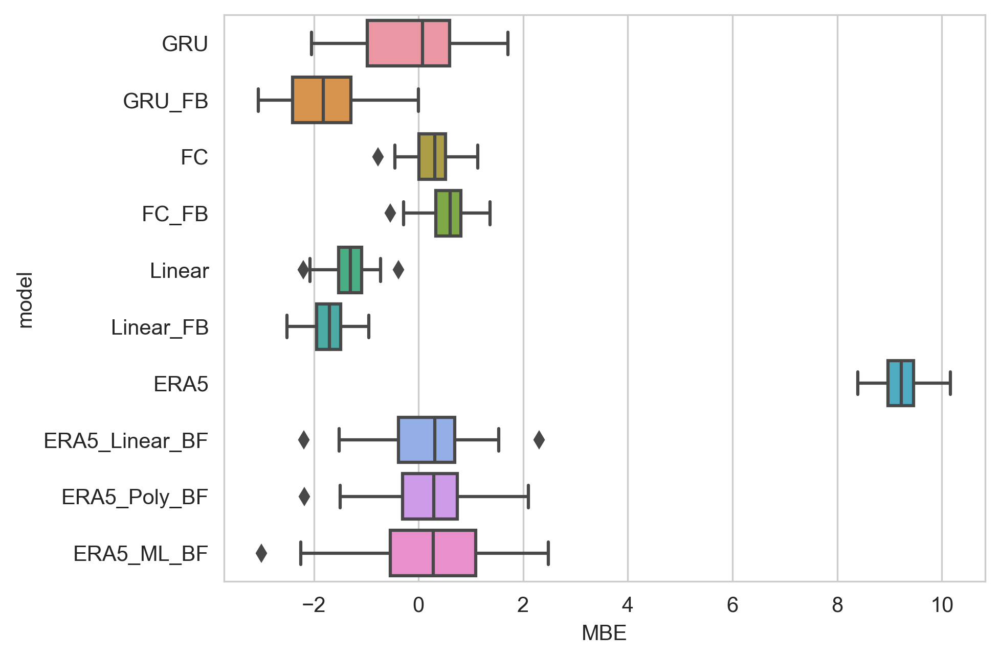

In [62]:
sns.boxplot(data=x, x="MBE", y="model")
plt.show()

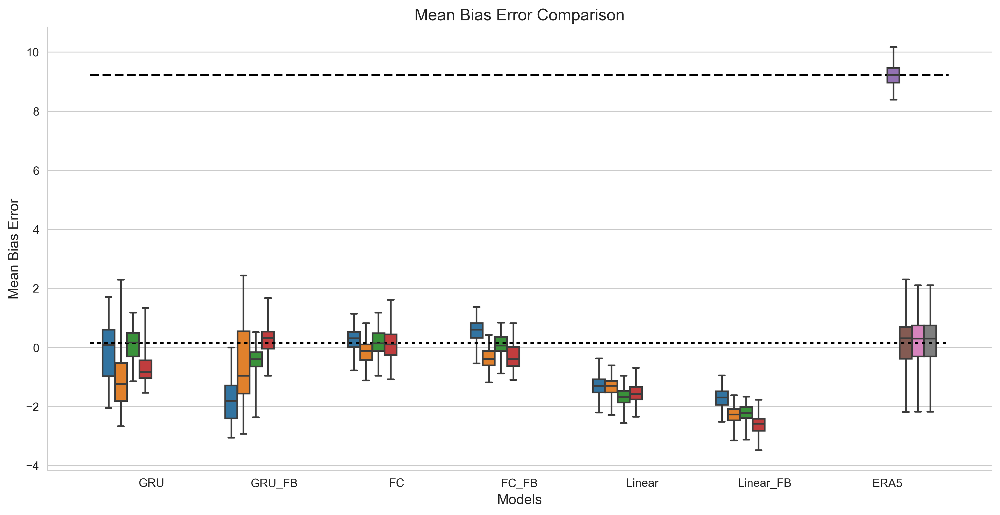

In [63]:
df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
df["config"] = "Regular - Sequential"

df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_RandomTime["config"] = "Regular - RandomTime"

df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_Anomaly["config"] = "Regular&Anomaly - Sequential"

df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_RandomTime, df_Anomaly, df_RandomTime_Anomaly, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(data=df_all, x="model_name", y="MBE", hue="config", kind="box", whis=np.infty, height=6, aspect=2, legend=False)
plt.hlines(np.mean(df_ERA5["MBE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["MBE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.title("Mean Bias Error Comparison", fontsize=14)
plt.xlabel("Models", fontsize=12)
plt.ylabel("Mean Bias Error", fontsize=12)
plt.show()

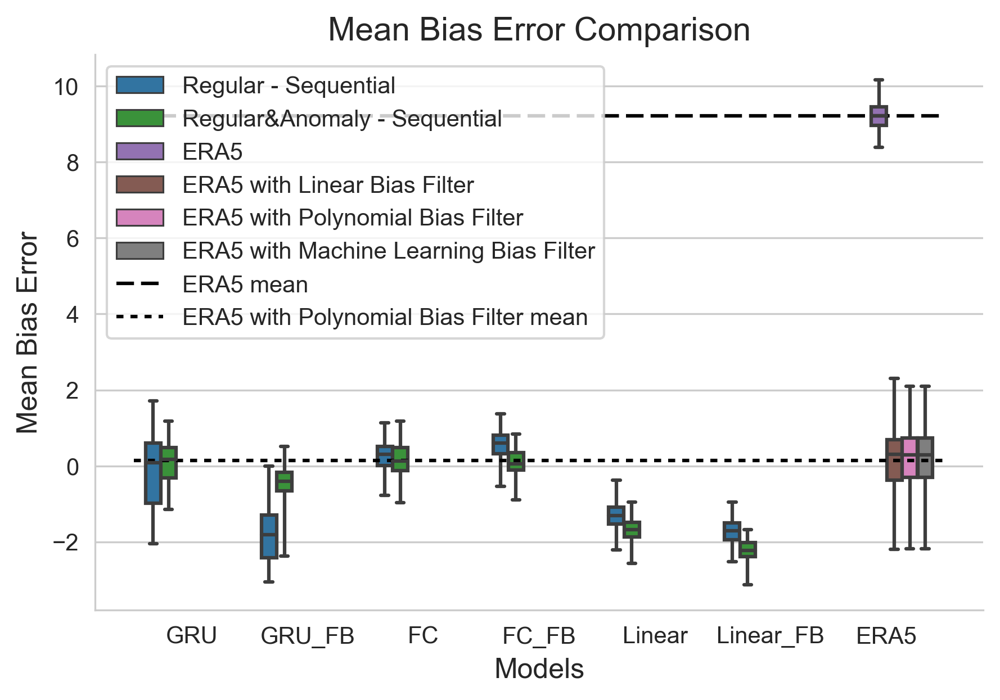

In [64]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}

df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
df["config"] = "Regular - Sequential"

# df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
# df_RandomTime["config"] = "Regular - RandomTime"

df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_Anomaly, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="MBE", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=4, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["MBE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["MBE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.title("Mean Bias Error Comparison", fontsize=14)
plt.xlabel("Models", fontsize=12)
plt.ylabel("Mean Bias Error", fontsize=12)
plt.legend()
plt.show()

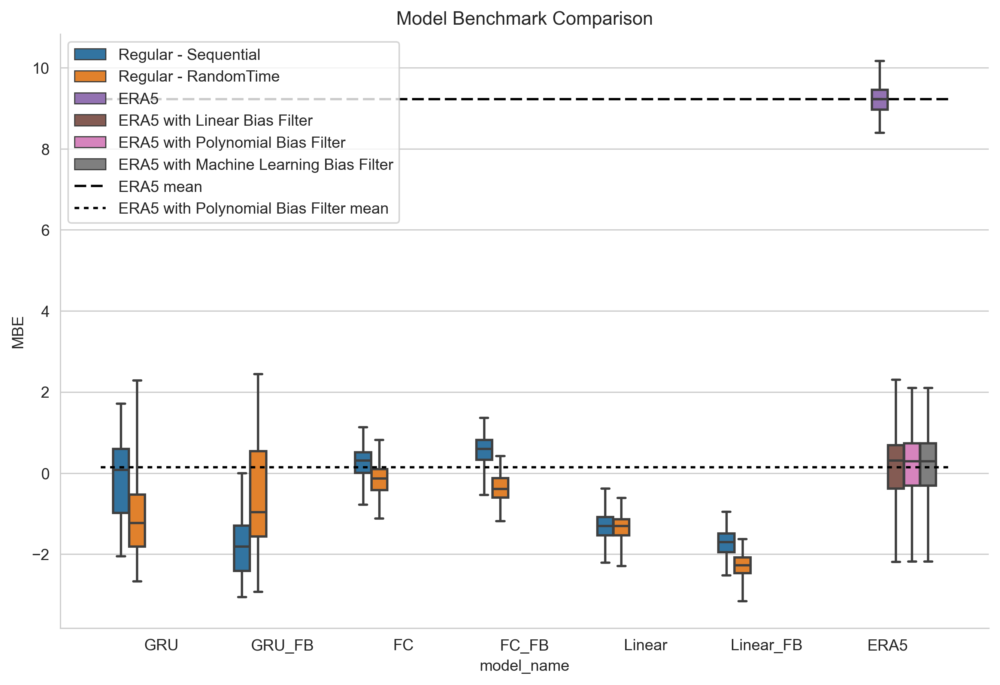

In [65]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}


df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
df["config"] = "Regular - Sequential"

df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_RandomTime["config"] = "Regular - RandomTime"

# df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
# df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_RandomTime, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="MBE", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=6, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["MBE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["MBE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

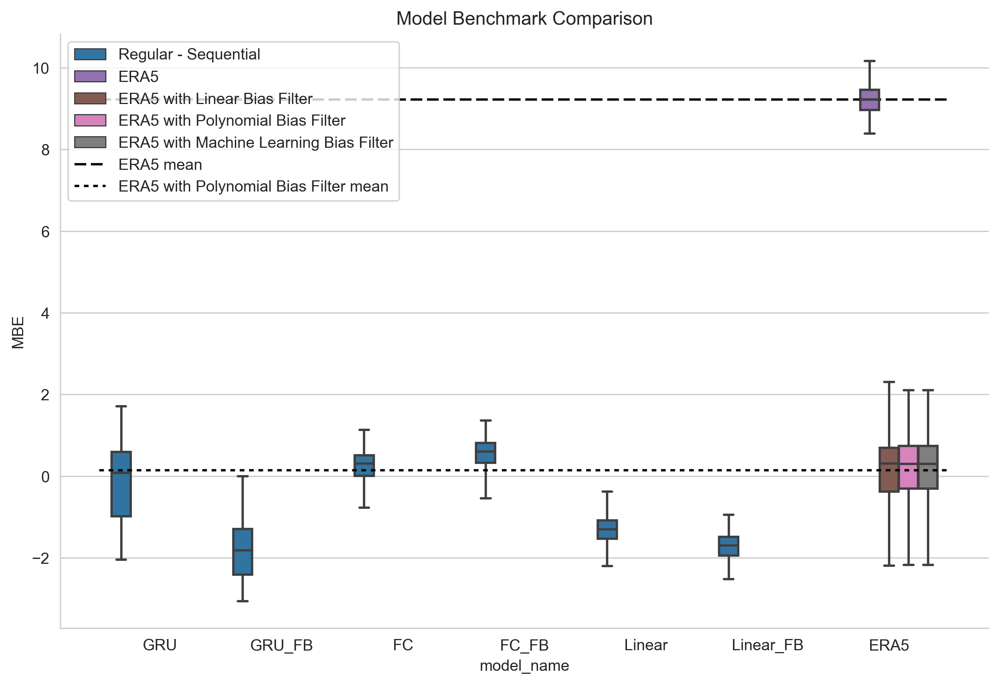

In [66]:
color_palette_dict = {
    [
        "Regular - Sequential", "Regular - RandomTime",
        "Regular&Anomaly - Sequential", "Regular&Anomaly - RandomTime",
        "ERA5", "ERA5 with Linear Bias Filter", "ERA5 with Polynomial Bias Filter", "ERA5 with Machine Learning Bias Filter",
    ][i]: COLOR_PALETTE[i] for i in np.arange(len(COLOR_PALETTE))
}


df = pd.DataFrame(data_ns).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
df["config"] = "Regular - Sequential"

# df_RandomTime = pd.DataFrame(data_nr).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
# df_RandomTime["config"] = "Regular - RandomTime"

# df_Anomaly = pd.DataFrame(data_as).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
# df_Anomaly["config"] = "Regular&Anomaly - Sequential"

# df_RandomTime_Anomaly = pd.DataFrame(data_ar).drop(["ERA5", "ERA5_Linear_BF",  "ERA5_Poly_BF", "ERA5_ML_BF"], axis=1).melt(var_name="model_name", value_name="MBE", ignore_index=True)
# df_RandomTime_Anomaly["config"] = "Regular&Anomaly - RandomTime"

df_ERA5 = pd.DataFrame(data_ns)[["ERA5"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5["config"] = "ERA5"

df_ERA5_Linear_BF = pd.DataFrame(data_ns)[["ERA5_Linear_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_Linear_BF["model_name"] = "ERA5"
df_ERA5_Linear_BF["config"] = "ERA5 with Linear Bias Filter"

df_ERA5_Poly_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_Poly_BF["model_name"] = "ERA5"
df_ERA5_Poly_BF["config"] = "ERA5 with Polynomial Bias Filter"

df_ERA5_ML_BF = pd.DataFrame(data_ns)[["ERA5_Poly_BF"]].melt(var_name="model_name", value_name="MBE", ignore_index=True)
df_ERA5_ML_BF["model_name"] = "ERA5"
df_ERA5_ML_BF["config"] = "ERA5 with Machine Learning Bias Filter"

df_all = pd.concat([df, df_ERA5, df_ERA5_Linear_BF, df_ERA5_Poly_BF, df_ERA5_ML_BF])

sns.catplot(
    data=df_all, 
    x="model_name", 
    y="MBE", 
    hue="config", 
    kind="box", 
    whis=np.infty,
    height=6, 
    aspect=1.5, 
    palette=color_palette_dict,
    legend=False)
plt.hlines(np.mean(df_ERA5["MBE"]), -0.5, 6.5, colors="black", linestyles=(0, (5, 2)), label="ERA5 mean")
plt.hlines(np.mean(df_ERA5_Poly_BF["MBE"]), -0.5, 6.5, colors="black", linestyles=(0, (2, 2)), label="ERA5 with Polynomial Bias Filter mean")

plt.legend()
plt.title("Model Benchmark Comparison")
plt.show()

## Bias Filter Stats

In [67]:
x_axis = np.linspace(0, 100, 101)
dict_bf_stats = {"input": [], "Linear Bias Filter": [], "Polynomial Bias Filter": [], "Machine Learning Bias Filter":[]}
for lbf, pbf, mlbf in tqdm(list(zip(lbf_collection, pbf_collection, mlbf_collection))):
    dict_bf_stats["input"] = np.concatenate([dict_bf_stats["input"], x_axis])
    dict_bf_stats["Linear Bias Filter"] = np.concatenate([dict_bf_stats["Linear Bias Filter"], lbf(x_axis)])
    dict_bf_stats["Polynomial Bias Filter"] = np.concatenate([dict_bf_stats["Polynomial Bias Filter"], pbf(x_axis)])
    dict_bf_stats["Machine Learning Bias Filter"] = np.concatenate([dict_bf_stats["Machine Learning Bias Filter"], mlbf(x_axis)])

100%|██████████| 1288/1288 [00:01<00:00, 715.66it/s]


In [68]:
df_bf_stats = pd.DataFrame(dict_bf_stats).melt(
    id_vars="input",
    var_name="Bias Filter Type",
    value_name="output"
)

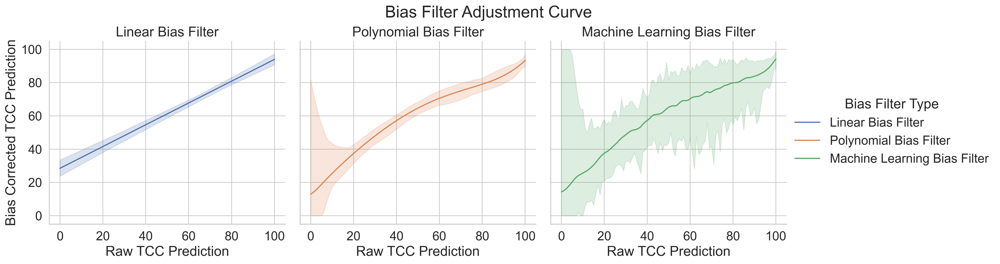

In [69]:
sns.set(font_scale = 1.5)
sns.set_style("whitegrid")

g = sns.relplot(
    data=df_bf_stats,
    x="input",
    y="output",
    hue="Bias Filter Type",
    col="Bias Filter Type",
    kind="line",
    errorbar=(lambda x: (np.min(x), np.max(x)))
)
g.set(
    xlabel="Raw TCC Prediction",
    ylabel="Bias Corrected TCC Prediction",
)
g.fig.subplots_adjust(top=.85)
g.fig.suptitle(
    "Bias Filter Adjustment Curve"
)
g.set_titles("{col_name}")
plt.show()

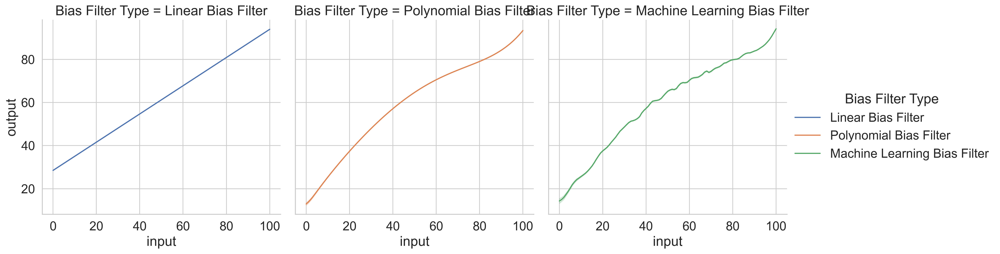

In [70]:
sns.relplot(
    data=df_bf_stats,
    x="input",
    y="output",
    hue="Bias Filter Type",
    col="Bias Filter Type",
    kind="line",
    errorbar=("ci", 95)
)
plt.show()

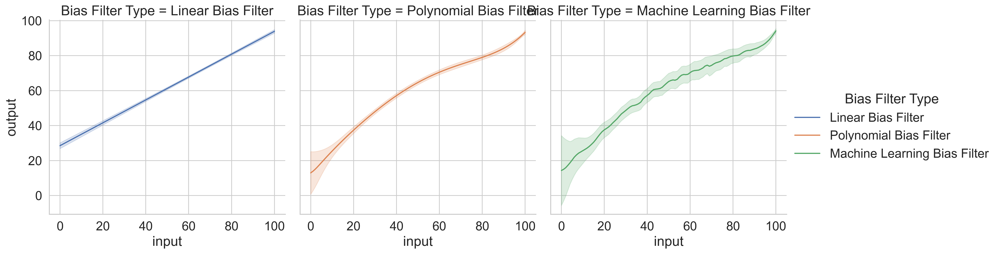

In [71]:
sns.relplot(
    data=df_bf_stats,
    x="input",
    y="output",
    hue="Bias Filter Type",
    col="Bias Filter Type",
    kind="line",
    errorbar=("sd")
)
plt.show()